# Conditional neural process

## Loss function

The conditional neural process uses a neural network to model the conditional distribution $y_T | x_{T}, x_{C}, y_{C}$

$$ \mathcal{L} = \mathbb{E}_f \left[\mathbb{E}_N \left[ \log p(y_{1:N} | x_{1:N}, y_{1:K}) \right]\right]$$

In [1]:
import tensorflow as tf
import tensorflow_probability as tfp
tfk = tf.keras
tfd = tfp.distributions

from IPython.display import HTML, set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')
css_style = open('../../../_static/custom_style.css', 'r').read()
HTML(f'<style>{css_style}</style>')

import numpy as np
import matplotlib.pyplot as plt
import datetime

from utils import eq_covariance,              \
                  sample_1d_datasets_from_gp

In [2]:
x_min = -4.
x_max = 4.
num_datasets = 64
num_datapoints = 30
scale = 2e0
cov_coeff = 1e0
noise_coeff = 1e-2

x, y = sample_1d_datasets_from_gp(x_min=x_min,
                                  x_max=x_max,
                                  num_datasets=num_datasets,
                                  num_datapoints=num_datapoints,
                                  scale=scale,
                                  cov_coeff=cov_coeff,
                                  noise_coeff=noise_coeff)

x, y = x[..., None], y[..., None]

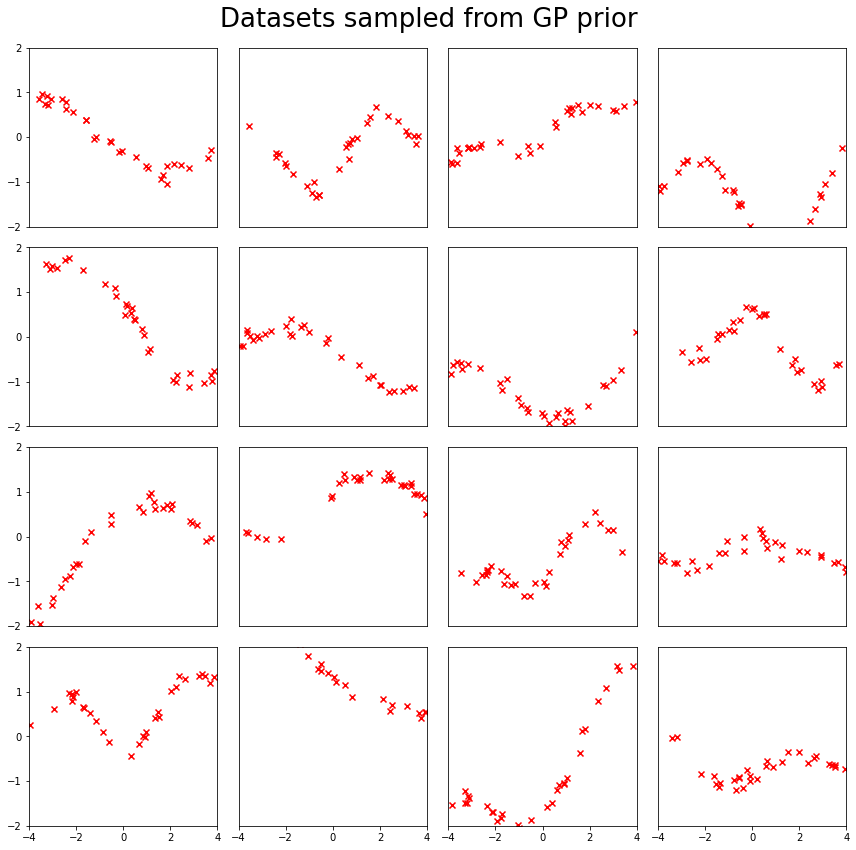

In [3]:
plt.figure(figsize=(12, 12))

for i in range(16):
    
    plt.subplot(4, 4, i + 1)
    plt.scatter(x[i, :, 0], y[i, :, 0], marker='x', color='red')
    
    plt.xlim([-4, 4])
    plt.ylim([-2, 2])
    
    plt.xticks(np.linspace(-4, 4, 5))
    plt.yticks(np.linspace(-2, 2, 5))
    
    if i % 4 != 0:
        plt.yticks([])
        
    if i <= 11 != 0:
        plt.xticks([])

plt.suptitle('Datasets sampled from GP prior', fontsize=26)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

We define a CNP to be the collection of an `encoder` and a `decoder` object. The `encoder` will map the context points to a single context vector. The `decoder` will map the context vector and each of the target inputs, to distributions over the target outputs.

In [4]:
class CNP(tf.Module):
    
    def __init__(self, encoder, decoder, name='cnp', **kwargs):
        
        
        super().__init__(name=name, **kwargs)
        
        self.encoder = encoder
        self.decoder = decoder
        
        
    def __call__(self, xc, yc, xt):
        
        r = self.encoder(xc, yc)
        yt_dist, cov, cov_plus_noise = self.decoder(xt, r)
        
        return yt_dist, cov, cov_plus_noise
    
    
    def loss(self, x, y, num_samples):
        
        num_batches = x.shape[0]
        batch_size = x.shape[1]
        
        loglik = 0
        
        for i in range(num_samples):
            
            n = x.shape[1] // 2 # tf.cast((batch_size - 1) * tf.random.uniform(()), dtype=tf.int32) + 1
            
            xc = x[:, :n, :]
            yc = y[:, :n, :]
            
            y_dist, _, _ = self.__call__(xc, yc, x)
            
            loglik = loglik + tf.reduce_sum(y_dist.log_prob(y[:, :, 0])) / (x.shape[0] * x.shape[1])
         
        loss = - loglik / num_samples
        
        return loss

In [5]:
class FeedforwardNetwork(tf.Module):
    
    def __init__(self,
                 input_dim,
                 output_dim,
                 hidden_dims,
                 nonlinearity,
                 name='feedforward_netork',
                 **kwargs):
        
        super().__init__(name=name, **kwargs)
        
        shapes = [input_dim] + hidden_dims + [output_dim]
        shapes = [(s1, s2) for s1, s2 in zip(shapes[:-1], shapes[1:])]
        
        self.W = []
        self.b = []
        self.num_linear = len(hidden_dims) + 1
        
        with self.name_scope:
            for shape in shapes:
                
                W = tf.Variable(tf.random.normal(shape=shape) / shape[0] ** 0.5)
                b = tf.Variable(tf.random.normal(shape=shape[1:]))
                
                self.W.append(W)
                self.b.append(b)
        
        self.nonlinearity = getattr(tf.nn, nonlinearity)
        
    
    def __call__(self, tensor):
        
        for i, (W, b) in enumerate(zip(self.W, self.b)):
            
            tensor = tf.einsum('...i, ij -> ...j', tensor, W) + b[None, None, :]
            
            if i < self.num_linear - 1:
                tensor = self.nonlinearity(tensor)
        
        return tensor

In [6]:
class NeuralNetworkEncoder(tf.Module):
    
    def __init__(self, feedforward_network, name='neural_network_encoder', **kwargs):
        
        super().__init__(name=name, **kwargs)
        
        self.feedforward_network = feedforward_network

    
    def __call__(self, xc, yc):
        
        c = tf.concat([xc, yc], axis=-1)
        r = self.feedforward_network(c)
        r = tf.reduce_mean(r, axis=1, keepdims=True)
        
        return r
        
        
class NeuralNetworkDecoder(tf.Module):
    
    def __init__(self, mean_network, cov_network, likelihood, name='neural_network_decoder', **kwargs):
        
        super().__init__(name=name, **kwargs)
        
        self.mean_network = mean_network
        self.cov_network = cov_network
        self.likelihood = likelihood
        
        self.log_cov_coeff = tf.Variable(tf.convert_to_tensor(-2.))

    
    def __call__(self, xt, r):
        
        r = tf.tile(r, multiples=(1, xt.shape[1], 1))
        xt_r = tf.concat([xt, r], axis=2)
        
        loc = self.mean_network(xt_r)
        cov_factor = self.cov_network(xt_r)
        cov_factor = cov_factor / cov_factor.shape[-1]
        
        num_cov_features = cov_factor.shape[2]
        cov_factor = cov_factor / tf.reduce_sum(cov_factor ** 2, axis=-1)[:, :, None] ** 0.5
        cov = tf.einsum('tni, tmi -> tnm', cov_factor, cov_factor)
        cov = tf.exp(self.log_cov_coeff) * cov
        cov_plus_noise = cov + tf.eye(cov.shape[1])[None, :, :] * 1e-2
        
        yt_dist = self.likelihood(loc, cov_plus_noise)
        
        return yt_dist, cov, cov_plus_noise

In [7]:
class FullCovGaussianLikelihood(tf.Module):
    
    def __init__(self):
        self.dist = tfd.MultivariateNormalFullCovariance
        
    
    def __call__(self, loc, cov):
        
        dist = self.dist(loc=loc[:, :, 0], covariance_matrix=cov)
        
        return dist
    
    
    def loglik(self, param_tensor, data):
        return self.__call__().log_prob(data)

logs/cnp/2021-01-22--14-42-46/train
Instructions for updating:
`MultivariateNormalFullCovariance` is deprecated, use `MultivariateNormalTriL(loc=loc, scale_tril=tf.linalg.cholesky(covariance_matrix))` instead.
loss tf.Tensor(33.865623, shape=(), dtype=float32)
cov coeff tf.Tensor(0.13547069, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000000.ckpt/assets


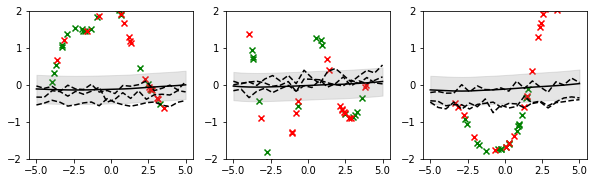

loss tf.Tensor(18.501305, shape=(), dtype=float32)
cov coeff tf.Tensor(0.136702, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000010.ckpt/assets


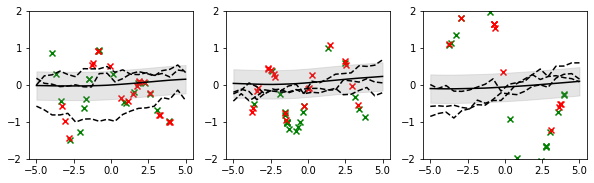

loss tf.Tensor(7.577648, shape=(), dtype=float32)
cov coeff tf.Tensor(0.13801853, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000020.ckpt/assets


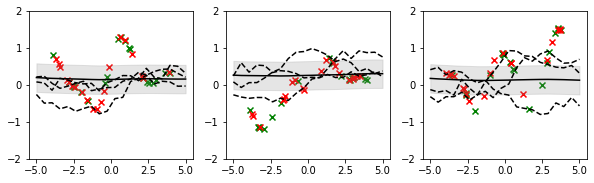

loss tf.Tensor(1.9664009, shape=(), dtype=float32)
cov coeff tf.Tensor(0.13936429, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000030.ckpt/assets


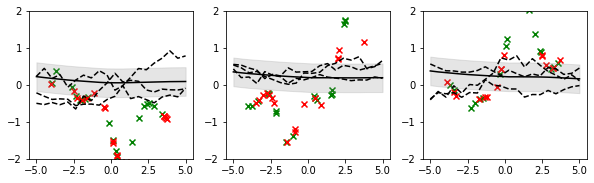

loss tf.Tensor(2.129794, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14054887, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000040.ckpt/assets


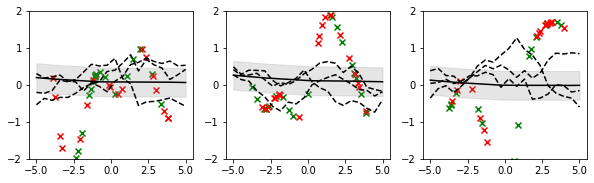

loss tf.Tensor(0.52317435, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14151399, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000050.ckpt/assets


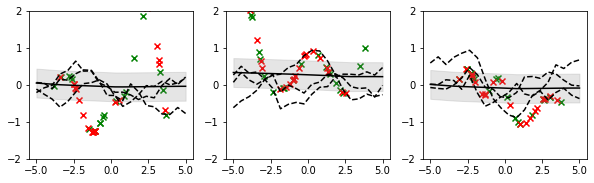

loss tf.Tensor(0.09549809, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14230976, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000060.ckpt/assets


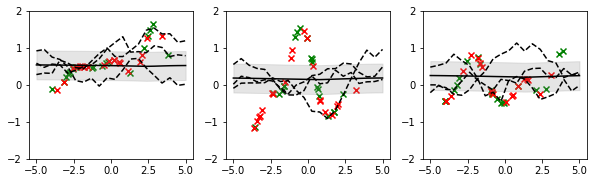

loss tf.Tensor(-0.13698635, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14301747, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000070.ckpt/assets


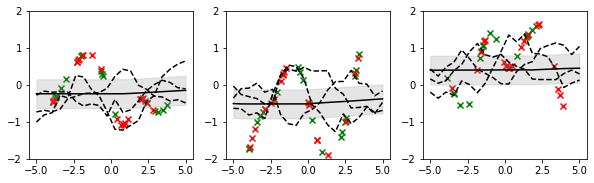

loss tf.Tensor(-0.030759191, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14360997, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000080.ckpt/assets


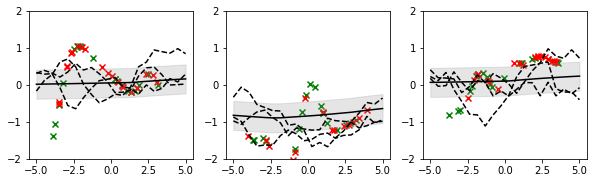

loss tf.Tensor(-0.13526739, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14415073, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000090.ckpt/assets


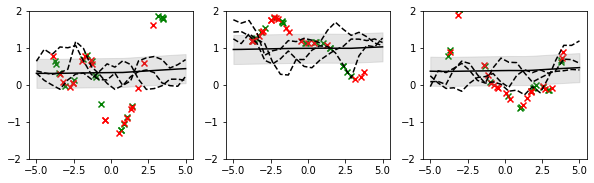

loss tf.Tensor(-0.42013848, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14465055, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000100.ckpt/assets


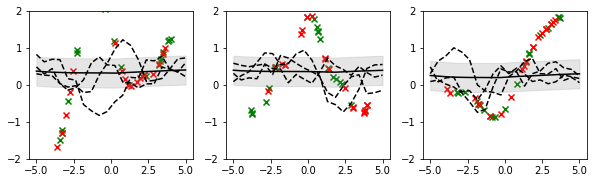

loss tf.Tensor(-0.27861777, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14513144, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000110.ckpt/assets


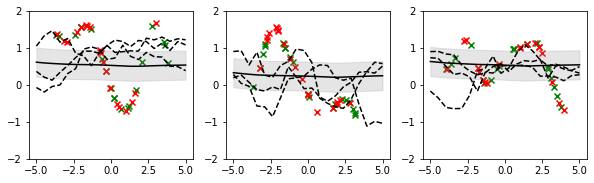

loss tf.Tensor(-0.30408624, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14562161, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000120.ckpt/assets


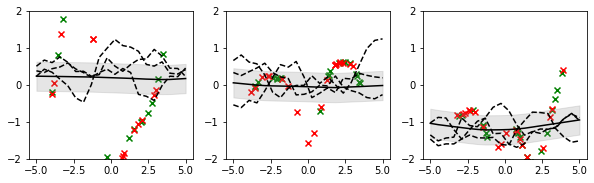

loss tf.Tensor(-0.21579948, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14610244, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000130.ckpt/assets


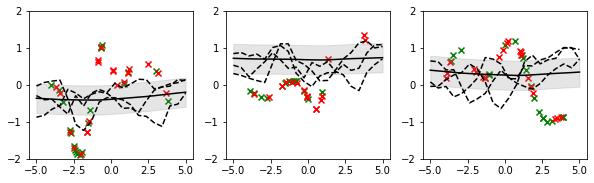

loss tf.Tensor(-0.34374177, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14658041, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000140.ckpt/assets


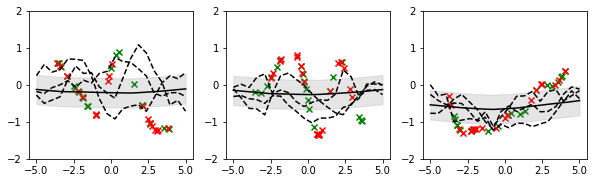

loss tf.Tensor(-0.45864025, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14704618, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000150.ckpt/assets


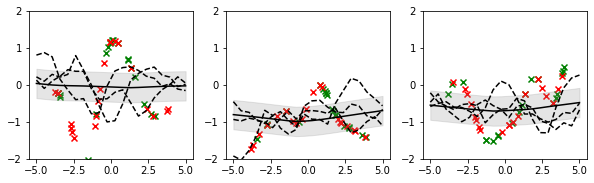

loss tf.Tensor(-0.22149803, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14755595, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000160.ckpt/assets


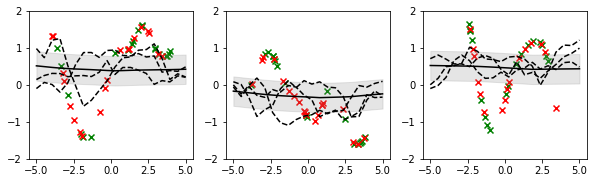

loss tf.Tensor(-0.13298833, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14814427, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000170.ckpt/assets


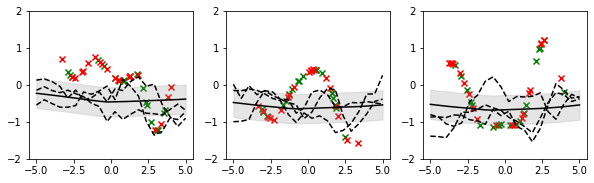

loss tf.Tensor(-0.33300138, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14873324, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000180.ckpt/assets


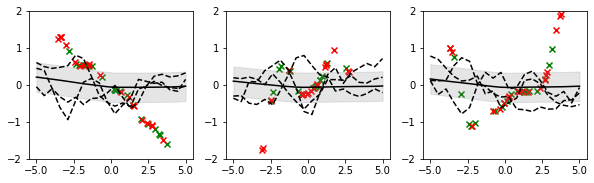

loss tf.Tensor(-0.30918345, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14926566, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000190.ckpt/assets


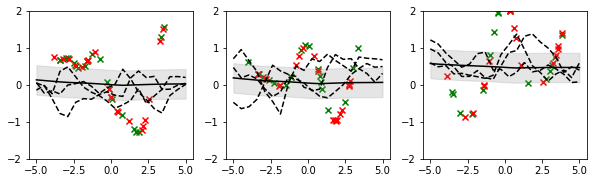

loss tf.Tensor(-0.36095303, shape=(), dtype=float32)
cov coeff tf.Tensor(0.14979677, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000200.ckpt/assets


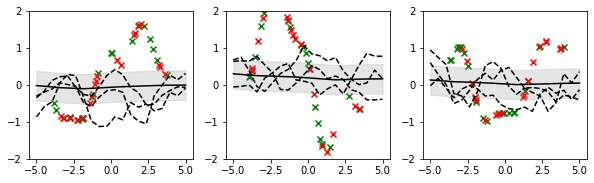

loss tf.Tensor(-0.39100432, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15035675, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000210.ckpt/assets


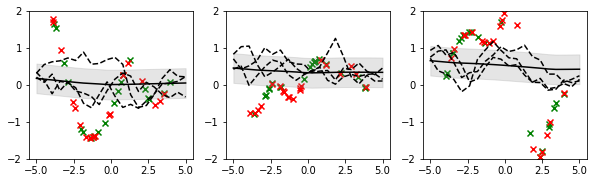

loss tf.Tensor(-0.3766054, shape=(), dtype=float32)
cov coeff tf.Tensor(0.1509437, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000220.ckpt/assets


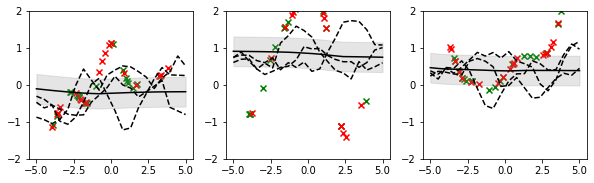

loss tf.Tensor(-0.38116634, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15152277, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000230.ckpt/assets


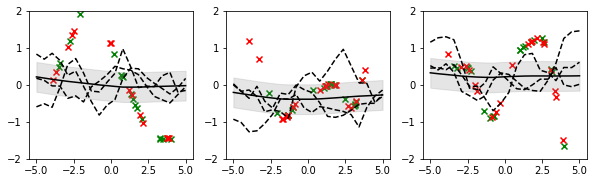

loss tf.Tensor(-0.34566367, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15208241, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000240.ckpt/assets


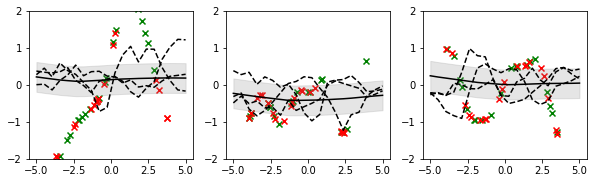

loss tf.Tensor(-0.46490437, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15262763, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000250.ckpt/assets


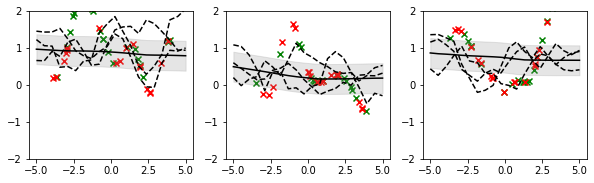

loss tf.Tensor(-0.37988177, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15313865, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000260.ckpt/assets


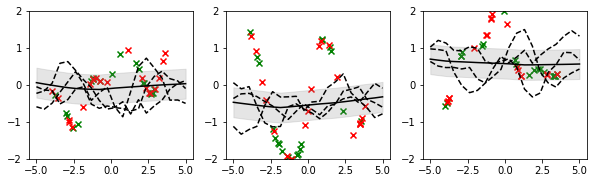

loss tf.Tensor(-0.3944581, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15368126, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000270.ckpt/assets


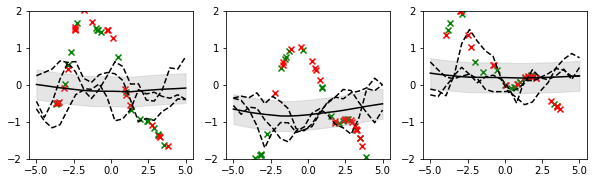

loss tf.Tensor(-0.42299613, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15423831, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000280.ckpt/assets


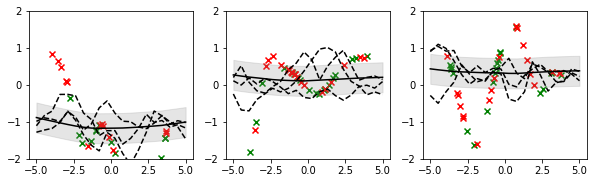

loss tf.Tensor(-0.34178185, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15478767, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000290.ckpt/assets


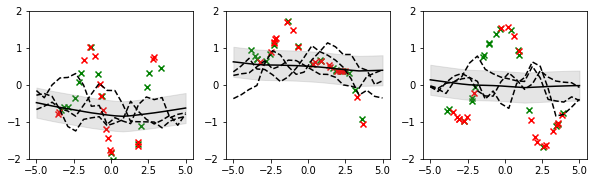

loss tf.Tensor(-0.44686726, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15536419, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000300.ckpt/assets


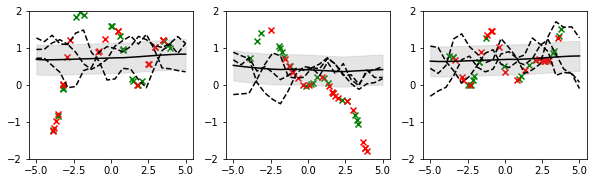

loss tf.Tensor(-0.3276571, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15596806, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000310.ckpt/assets


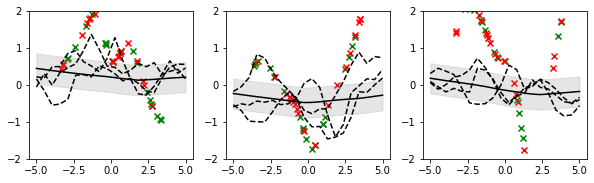

loss tf.Tensor(-0.3344783, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15658478, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000320.ckpt/assets


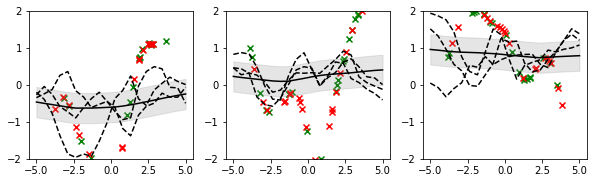

loss tf.Tensor(-0.5901621, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15718941, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000330.ckpt/assets


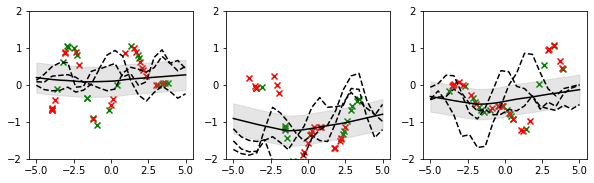

loss tf.Tensor(-0.40000305, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15774938, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000340.ckpt/assets


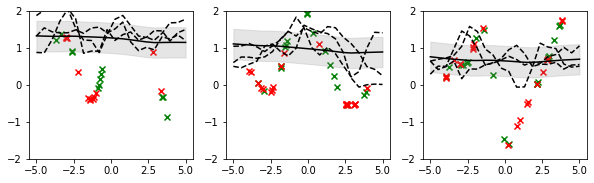

loss tf.Tensor(-0.48639053, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15831129, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000350.ckpt/assets


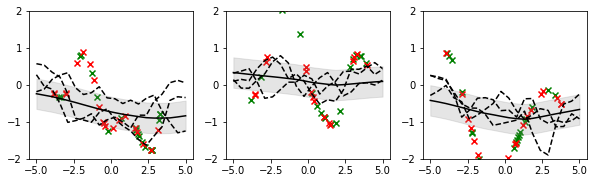

loss tf.Tensor(-0.5302765, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15886006, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000360.ckpt/assets


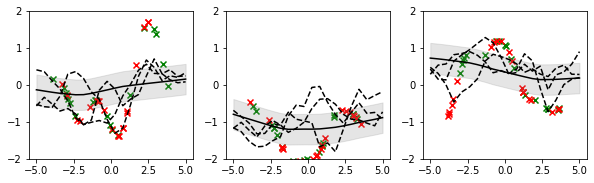

loss tf.Tensor(-0.39892733, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15940933, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000370.ckpt/assets


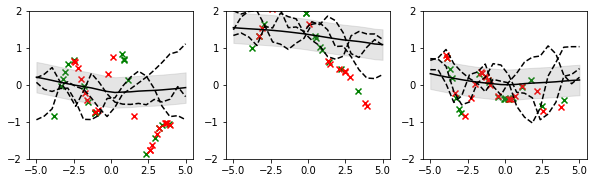

loss tf.Tensor(-0.55170006, shape=(), dtype=float32)
cov coeff tf.Tensor(0.15998536, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000380.ckpt/assets


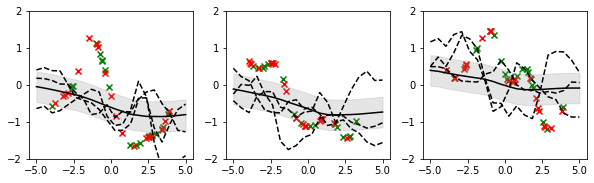

loss tf.Tensor(-0.503297, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16057725, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000390.ckpt/assets


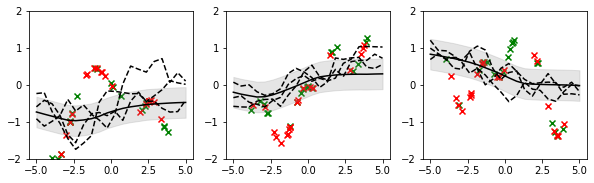

loss tf.Tensor(-0.507847, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16113396, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000400.ckpt/assets


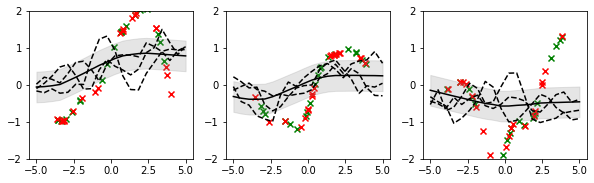

loss tf.Tensor(-0.5157653, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16169749, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000410.ckpt/assets


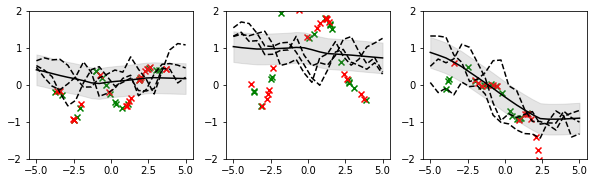

loss tf.Tensor(-0.5352629, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16227524, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000420.ckpt/assets


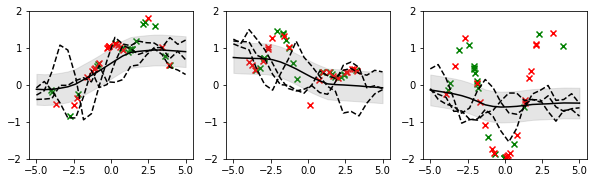

loss tf.Tensor(-0.5141836, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16279282, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000430.ckpt/assets


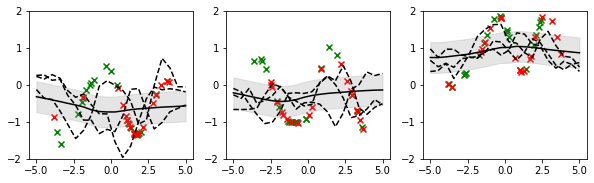

loss tf.Tensor(-0.48660132, shape=(), dtype=float32)
cov coeff tf.Tensor(0.1632806, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000440.ckpt/assets


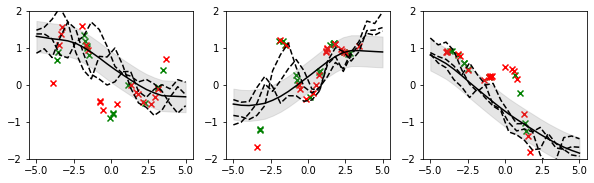

loss tf.Tensor(-0.45949668, shape=(), dtype=float32)
cov coeff tf.Tensor(0.1637804, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000450.ckpt/assets


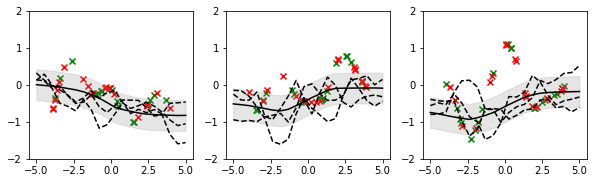

loss tf.Tensor(-0.5368051, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16432784, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000460.ckpt/assets


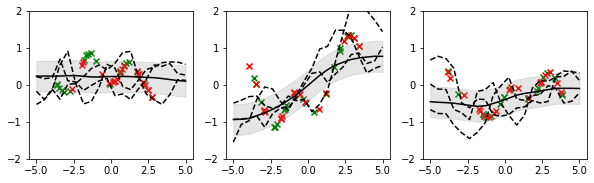

loss tf.Tensor(-0.5124485, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16488564, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000470.ckpt/assets


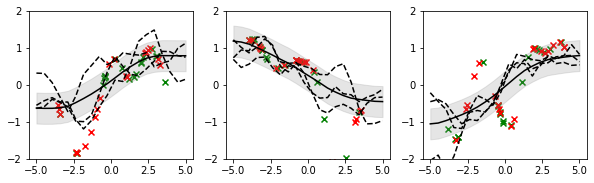

loss tf.Tensor(-0.41957656, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16546115, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000480.ckpt/assets


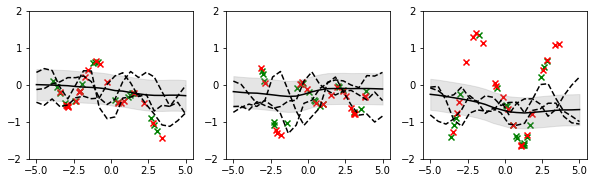

loss tf.Tensor(-0.49039552, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16603237, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000490.ckpt/assets


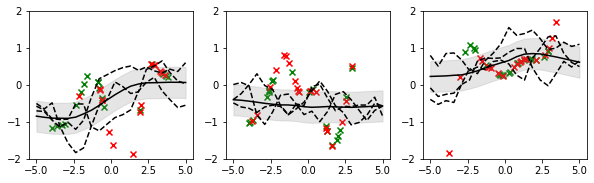

loss tf.Tensor(-0.6160535, shape=(), dtype=float32)
cov coeff tf.Tensor(0.1665682, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000500.ckpt/assets


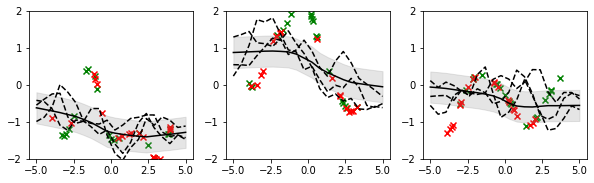

loss tf.Tensor(-0.50118864, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16706245, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000510.ckpt/assets


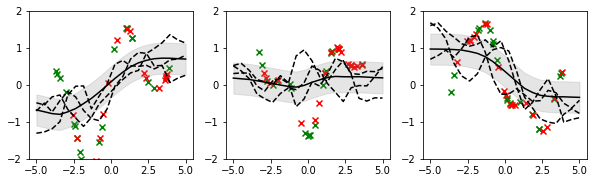

loss tf.Tensor(-0.50047827, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16756734, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000520.ckpt/assets


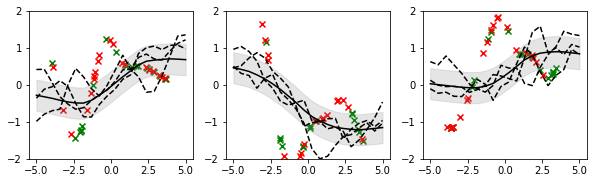

loss tf.Tensor(-0.5525076, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16810167, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000530.ckpt/assets


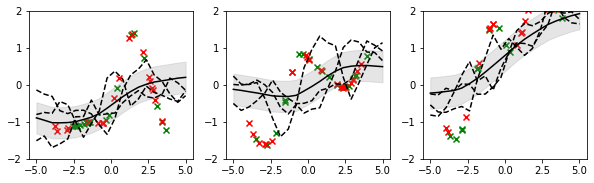

loss tf.Tensor(-0.4726248, shape=(), dtype=float32)
cov coeff tf.Tensor(0.16866909, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000540.ckpt/assets


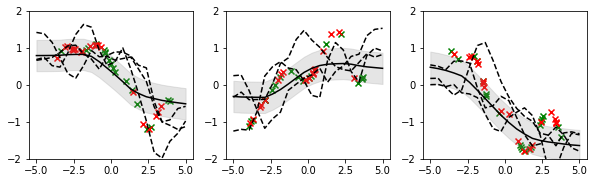

loss tf.Tensor(-0.5233135, shape=(), dtype=float32)
cov coeff tf.Tensor(0.1692525, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000550.ckpt/assets


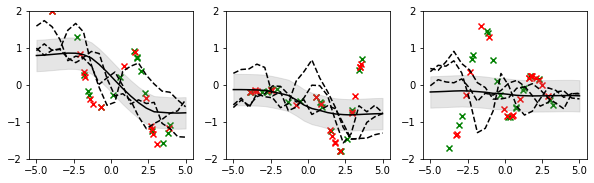

loss tf.Tensor(-0.55393595, shape=(), dtype=float32)
cov coeff tf.Tensor(0.1698505, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000560.ckpt/assets


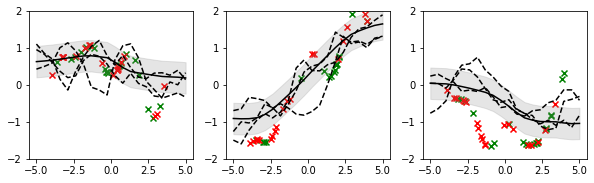

loss tf.Tensor(-0.5746785, shape=(), dtype=float32)
cov coeff tf.Tensor(0.1704734, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000570.ckpt/assets


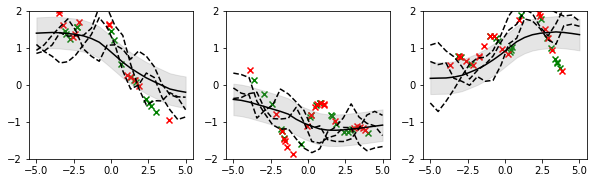

loss tf.Tensor(-0.5834614, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17109117, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000580.ckpt/assets


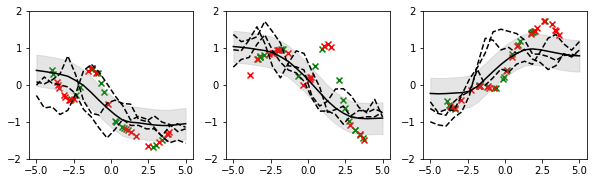

loss tf.Tensor(-0.527871, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17167766, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000590.ckpt/assets


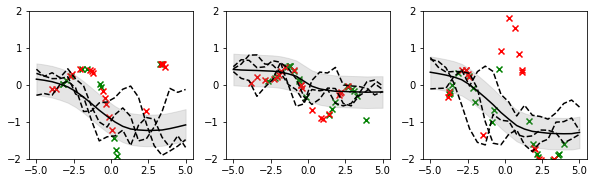

loss tf.Tensor(-0.5121767, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17228173, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000600.ckpt/assets


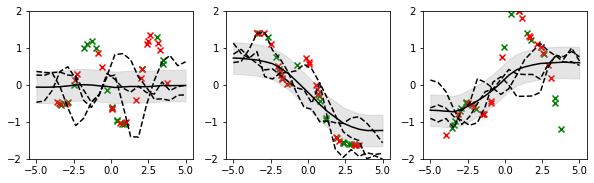

loss tf.Tensor(-0.50638956, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17286578, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000610.ckpt/assets


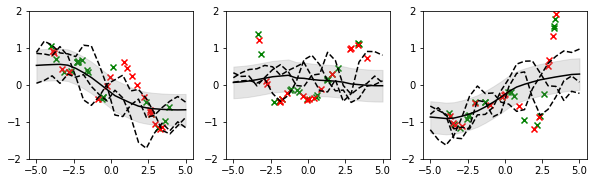

loss tf.Tensor(-0.57715034, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17342292, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000620.ckpt/assets


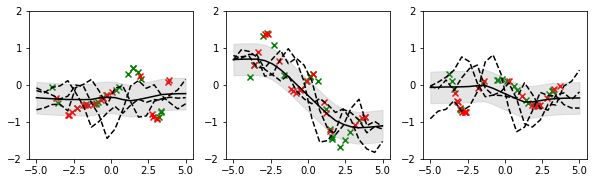

loss tf.Tensor(-0.62059516, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17395748, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000630.ckpt/assets


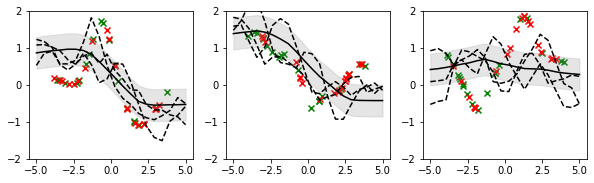

loss tf.Tensor(-0.5436737, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17447652, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000640.ckpt/assets


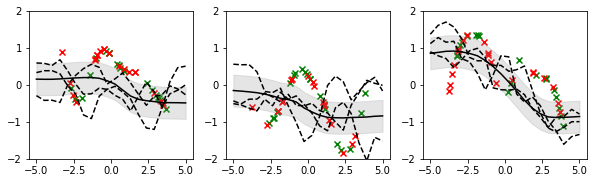

loss tf.Tensor(-0.46936852, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17506343, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000650.ckpt/assets


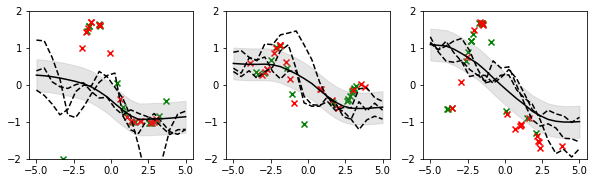

loss tf.Tensor(-0.5146965, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17565267, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000660.ckpt/assets


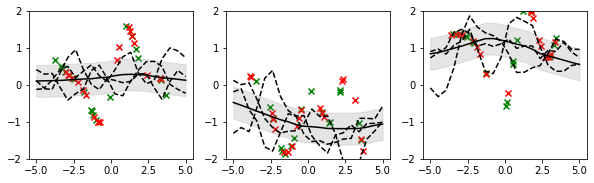

loss tf.Tensor(-0.58061355, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17622316, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000670.ckpt/assets


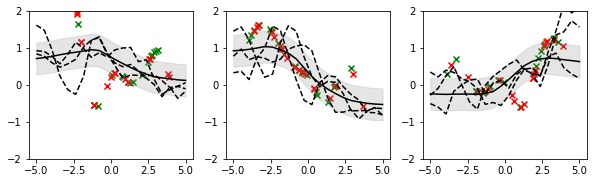

loss tf.Tensor(-0.5674832, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17681518, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000680.ckpt/assets


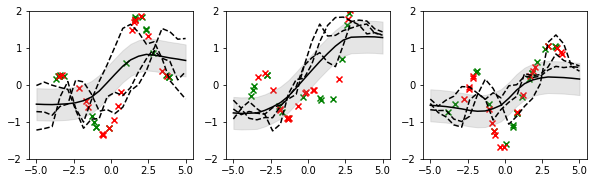

loss tf.Tensor(-0.51107585, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17740533, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000690.ckpt/assets


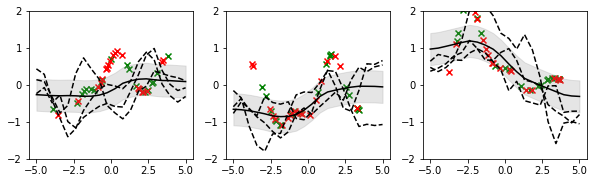

loss tf.Tensor(-0.6277463, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17800514, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000700.ckpt/assets


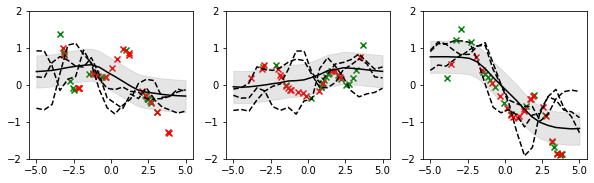

loss tf.Tensor(-0.5543573, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17858377, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000710.ckpt/assets


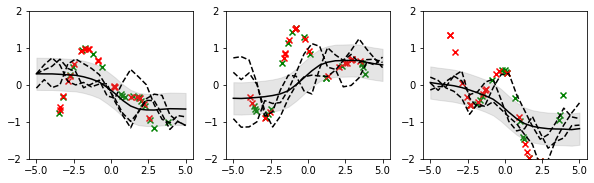

loss tf.Tensor(-0.46630576, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17918316, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000720.ckpt/assets


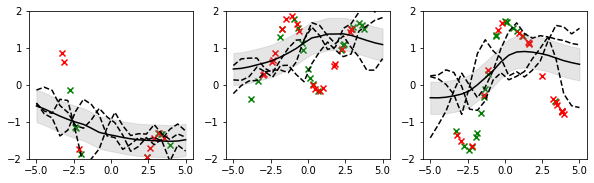

loss tf.Tensor(-0.5270555, shape=(), dtype=float32)
cov coeff tf.Tensor(0.17982242, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000730.ckpt/assets


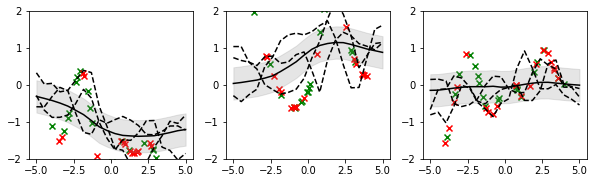

loss tf.Tensor(-0.58847404, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18048577, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000740.ckpt/assets


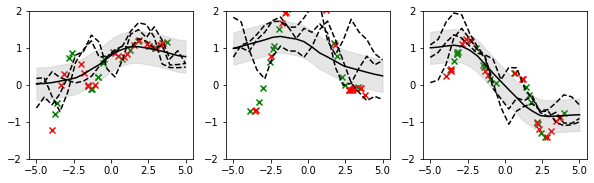

loss tf.Tensor(-0.631719, shape=(), dtype=float32)
cov coeff tf.Tensor(0.1811448, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000750.ckpt/assets


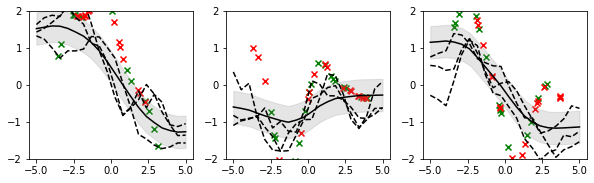

loss tf.Tensor(-0.51422507, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18178092, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000760.ckpt/assets


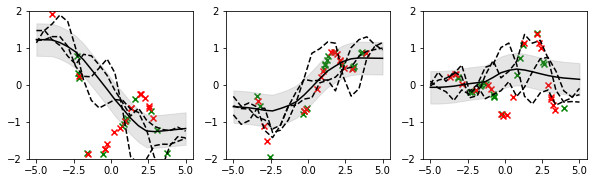

loss tf.Tensor(-0.51459235, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18236482, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000770.ckpt/assets


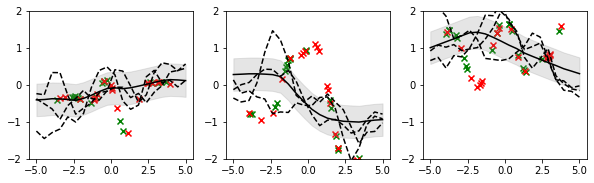

loss tf.Tensor(-0.63826364, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18293923, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000780.ckpt/assets


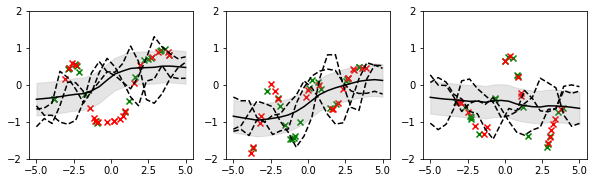

loss tf.Tensor(-0.61612743, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18349548, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000790.ckpt/assets


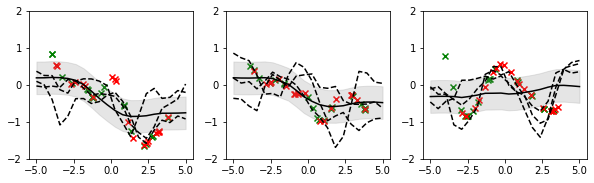

loss tf.Tensor(-0.63642, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18405978, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000800.ckpt/assets


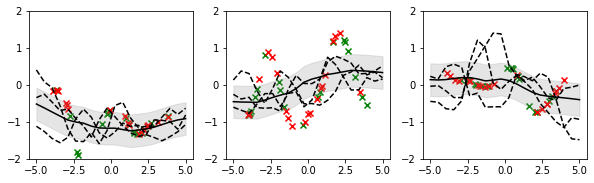

loss tf.Tensor(-0.5861283, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18463005, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000810.ckpt/assets


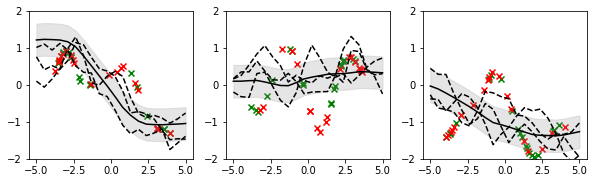

loss tf.Tensor(-0.57079434, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18524879, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000820.ckpt/assets


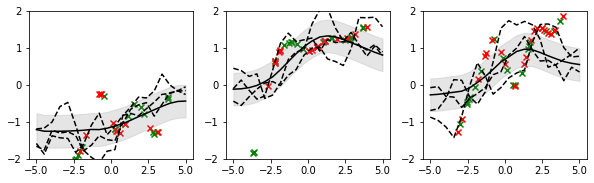

loss tf.Tensor(-0.62392455, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18587245, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000830.ckpt/assets


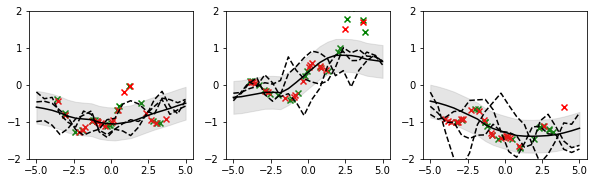

loss tf.Tensor(-0.5912489, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18650664, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000840.ckpt/assets


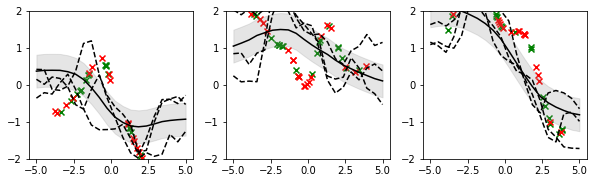

loss tf.Tensor(-0.56560534, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18714717, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000850.ckpt/assets


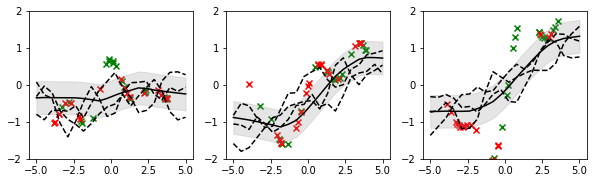

loss tf.Tensor(-0.63289887, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18777473, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000860.ckpt/assets


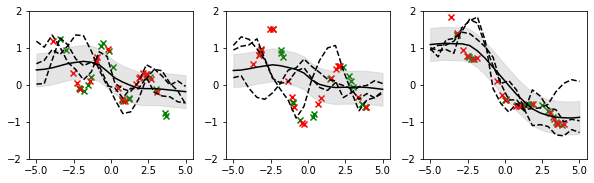

loss tf.Tensor(-0.56929505, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18840331, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000870.ckpt/assets


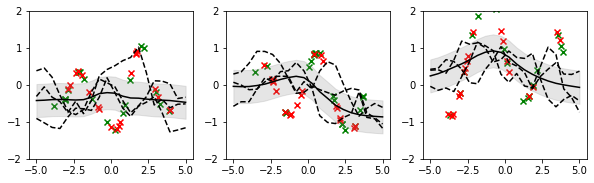

loss tf.Tensor(-0.51776195, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18905786, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000880.ckpt/assets


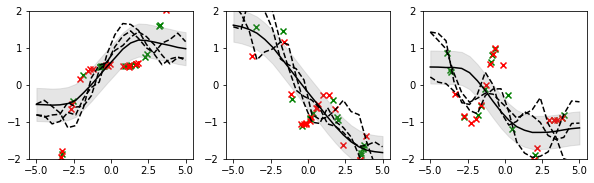

loss tf.Tensor(-0.5067909, shape=(), dtype=float32)
cov coeff tf.Tensor(0.18976514, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000890.ckpt/assets


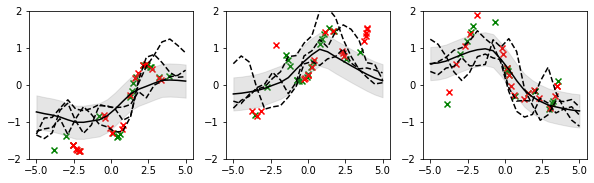

loss tf.Tensor(-0.6153015, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19051225, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000900.ckpt/assets


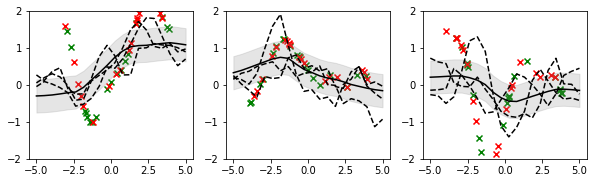

loss tf.Tensor(-0.6226502, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19115727, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000910.ckpt/assets


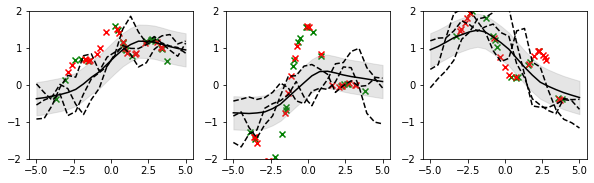

loss tf.Tensor(-0.5612284, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19175659, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000920.ckpt/assets


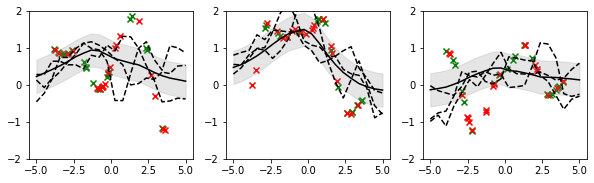

loss tf.Tensor(-0.5928142, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19234034, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000930.ckpt/assets


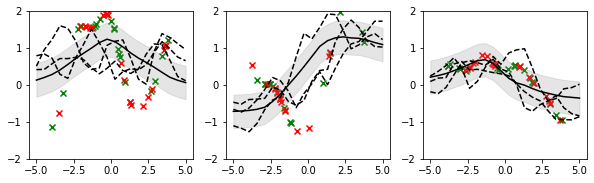

loss tf.Tensor(-0.5982907, shape=(), dtype=float32)
cov coeff tf.Tensor(0.1929286, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000940.ckpt/assets


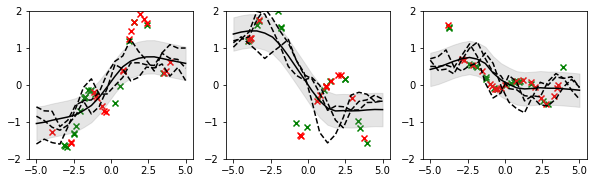

loss tf.Tensor(-0.60962695, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19351387, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000950.ckpt/assets


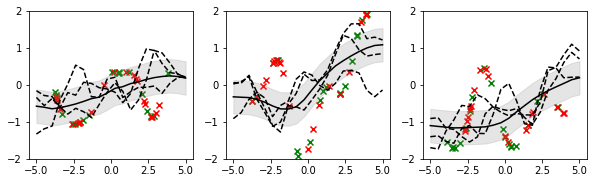

loss tf.Tensor(-0.58155024, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19408289, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000960.ckpt/assets


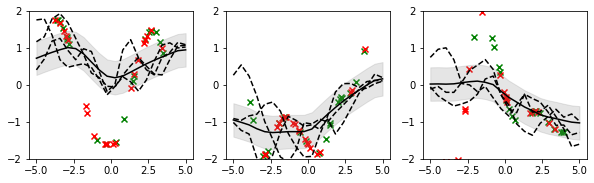

loss tf.Tensor(-0.59294266, shape=(), dtype=float32)
cov coeff tf.Tensor(0.1946392, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000970.ckpt/assets


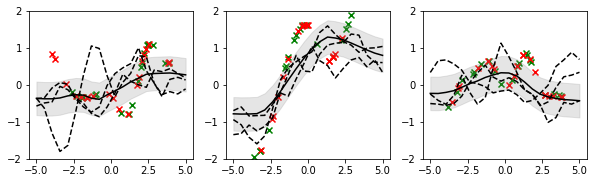

loss tf.Tensor(-0.58913654, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19519038, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000980.ckpt/assets


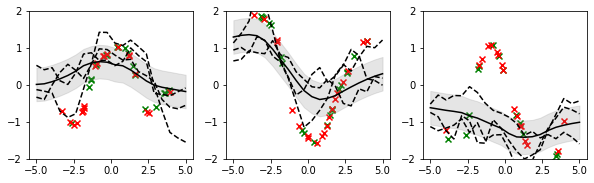

loss tf.Tensor(-0.67793655, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19573632, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/000990.ckpt/assets


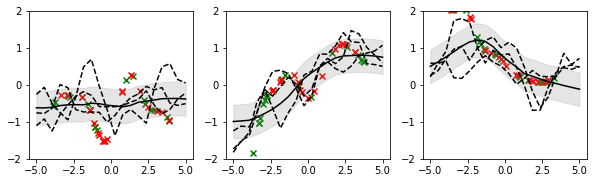

loss tf.Tensor(-0.57289106, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19626777, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001000.ckpt/assets


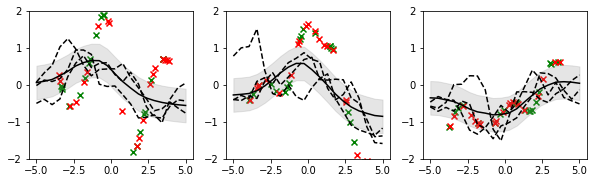

loss tf.Tensor(-0.531927, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19679864, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001010.ckpt/assets


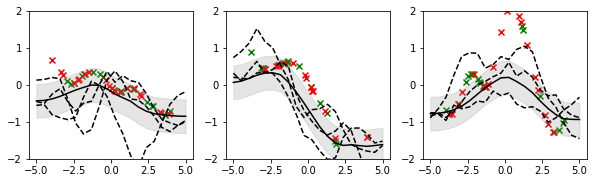

loss tf.Tensor(-0.5317055, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19738227, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001020.ckpt/assets


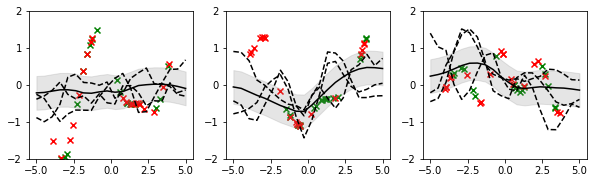

loss tf.Tensor(-0.6288596, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19793802, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001030.ckpt/assets


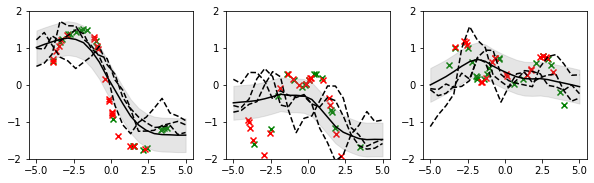

loss tf.Tensor(-0.6357105, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19848575, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001040.ckpt/assets


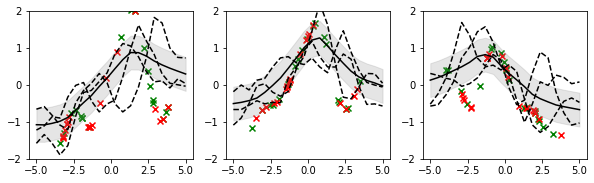

loss tf.Tensor(-0.5502897, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19902632, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001050.ckpt/assets


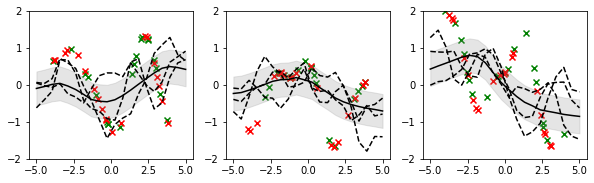

loss tf.Tensor(-0.6657107, shape=(), dtype=float32)
cov coeff tf.Tensor(0.19957092, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001060.ckpt/assets


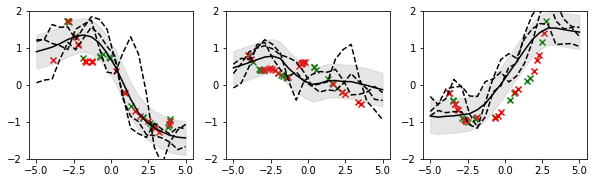

loss tf.Tensor(-0.5840328, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20014036, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001070.ckpt/assets


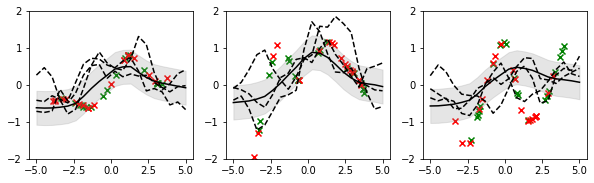

loss tf.Tensor(-0.60130084, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20071127, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001080.ckpt/assets


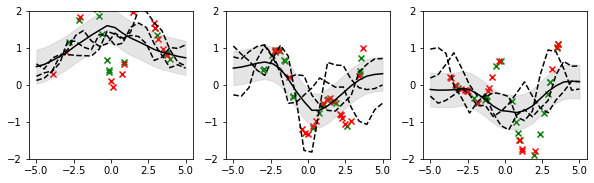

loss tf.Tensor(-0.6095673, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20124048, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001090.ckpt/assets


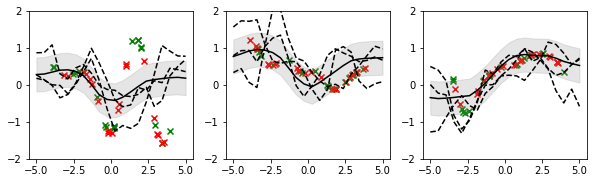

loss tf.Tensor(-0.65071017, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20176716, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001100.ckpt/assets


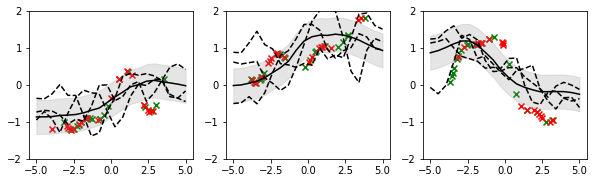

loss tf.Tensor(-0.6536094, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20227206, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001110.ckpt/assets


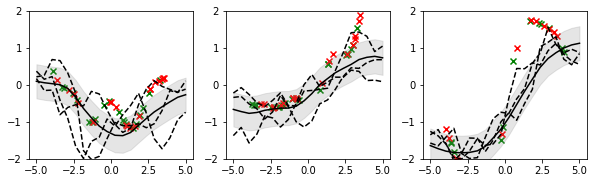

loss tf.Tensor(-0.6542211, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2027672, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001120.ckpt/assets


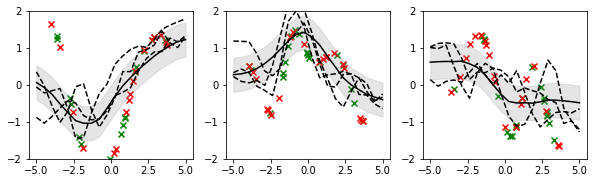

loss tf.Tensor(-0.607168, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20332626, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001130.ckpt/assets


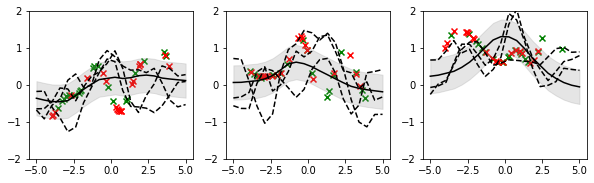

loss tf.Tensor(-0.57709634, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20394012, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001140.ckpt/assets


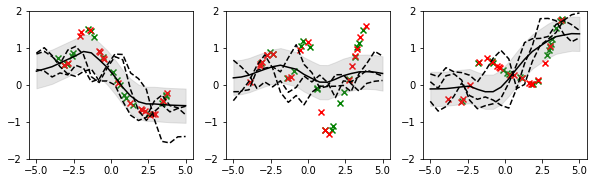

loss tf.Tensor(-0.68990743, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2045662, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001150.ckpt/assets


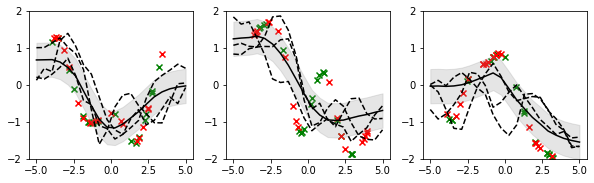

loss tf.Tensor(-0.62056416, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20514186, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001160.ckpt/assets


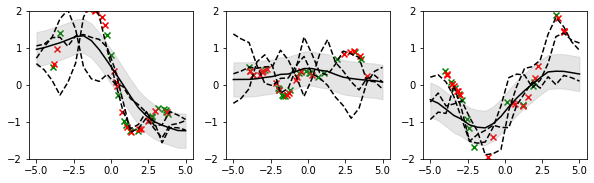

loss tf.Tensor(-0.66356146, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20565376, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001170.ckpt/assets


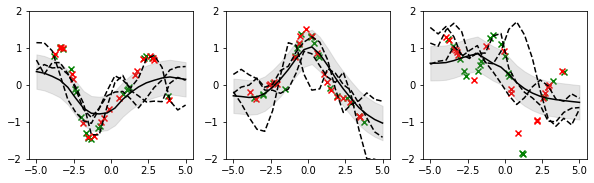

loss tf.Tensor(-0.6805363, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20616905, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001180.ckpt/assets


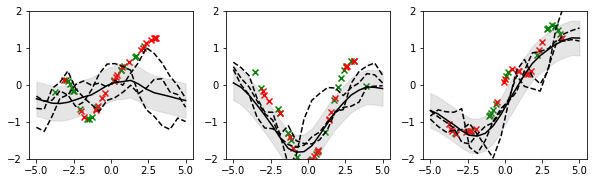

loss tf.Tensor(-0.62582695, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20668446, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001190.ckpt/assets


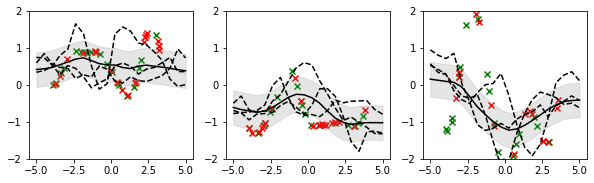

loss tf.Tensor(-0.60990745, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20716433, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001200.ckpt/assets


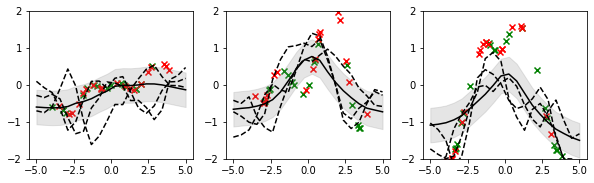

loss tf.Tensor(-0.578271, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20768909, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001210.ckpt/assets


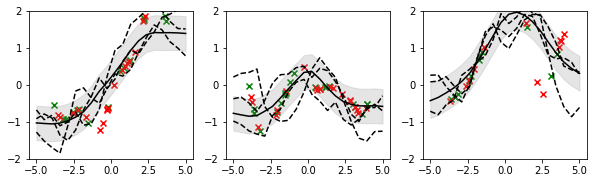

loss tf.Tensor(-0.68702775, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20822875, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001220.ckpt/assets


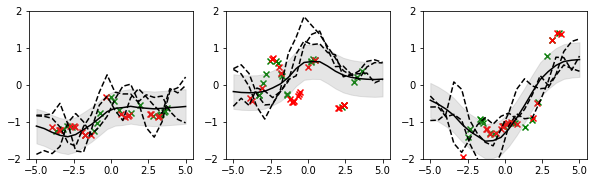

loss tf.Tensor(-0.66172, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20872407, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001230.ckpt/assets


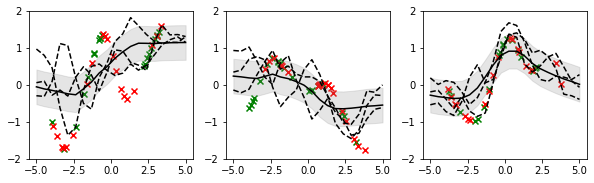

loss tf.Tensor(-0.67625153, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20921828, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001240.ckpt/assets


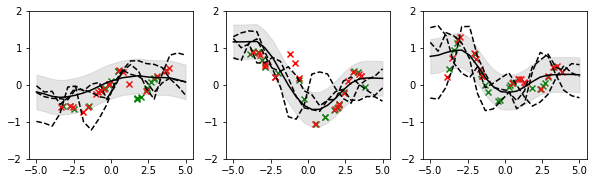

loss tf.Tensor(-0.6799125, shape=(), dtype=float32)
cov coeff tf.Tensor(0.20972545, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001250.ckpt/assets


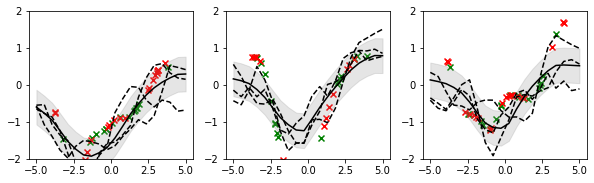

loss tf.Tensor(-0.6655323, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21017908, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001260.ckpt/assets


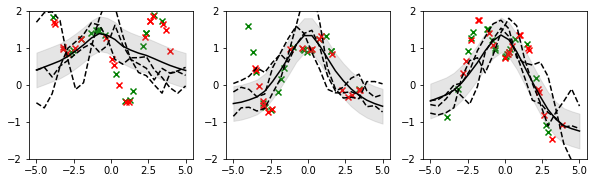

loss tf.Tensor(-0.56848174, shape=(), dtype=float32)
cov coeff tf.Tensor(0.210611, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001270.ckpt/assets


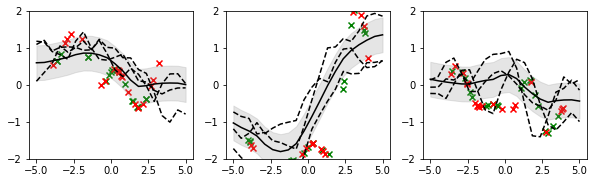

loss tf.Tensor(-0.64642453, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21121898, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001280.ckpt/assets


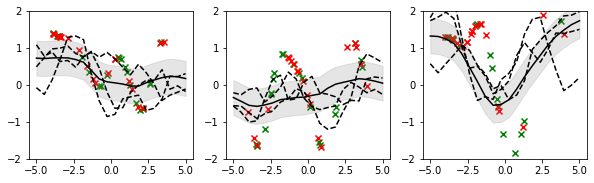

loss tf.Tensor(-0.64338773, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21176246, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001290.ckpt/assets


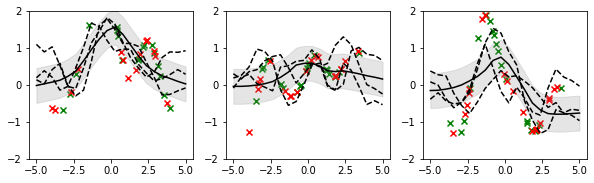

loss tf.Tensor(-0.632977, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2122715, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001300.ckpt/assets


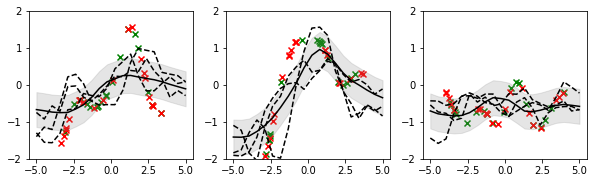

loss tf.Tensor(-0.6639494, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21281476, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001310.ckpt/assets


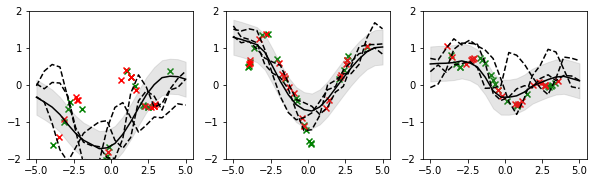

loss tf.Tensor(-0.6079087, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21334372, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001320.ckpt/assets


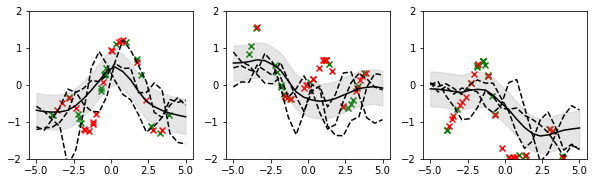

loss tf.Tensor(-0.60895354, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21385165, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001330.ckpt/assets


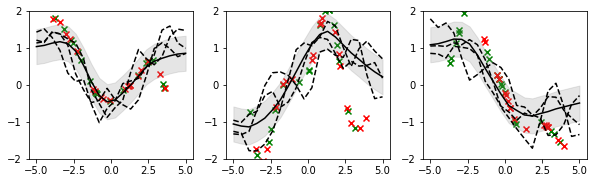

loss tf.Tensor(-0.65527505, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21432228, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001340.ckpt/assets


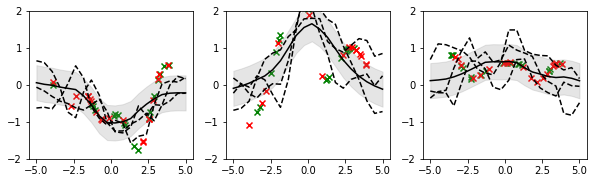

loss tf.Tensor(-0.6229895, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2147876, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001350.ckpt/assets


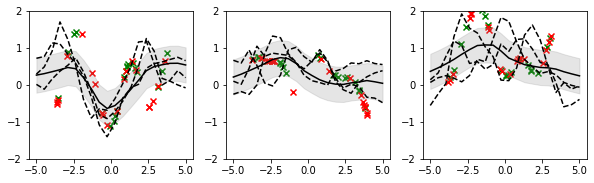

loss tf.Tensor(-0.6892702, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21522525, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001360.ckpt/assets


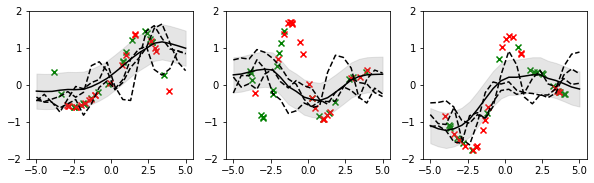

loss tf.Tensor(-0.69114256, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21568228, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001370.ckpt/assets


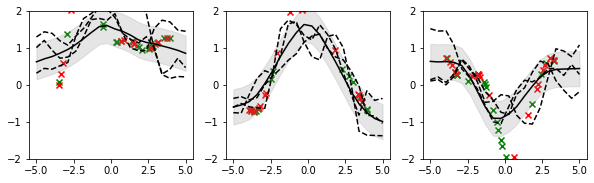

loss tf.Tensor(-0.654431, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21611677, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001380.ckpt/assets


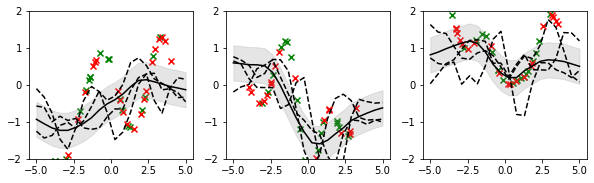

loss tf.Tensor(-0.59875315, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21659364, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001390.ckpt/assets


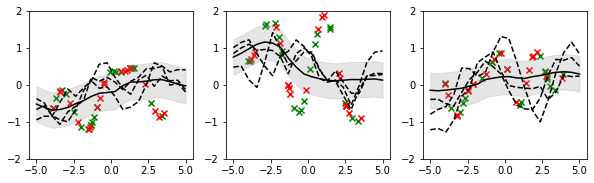

loss tf.Tensor(-0.6239392, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21704918, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001400.ckpt/assets


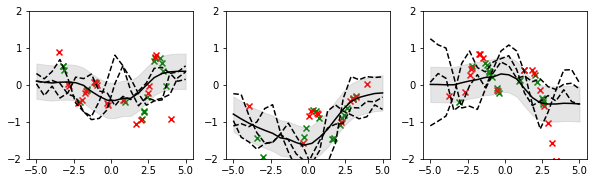

loss tf.Tensor(-0.68036264, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21747412, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001410.ckpt/assets


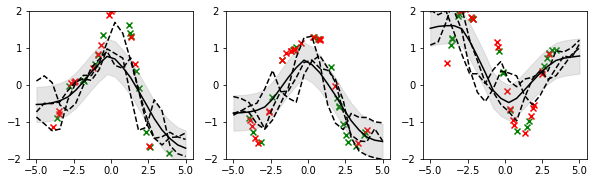

loss tf.Tensor(-0.6763207, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21783727, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001420.ckpt/assets


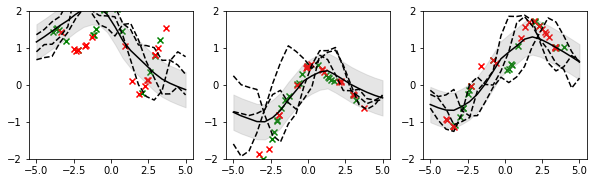

loss tf.Tensor(-0.65922296, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21825565, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001430.ckpt/assets


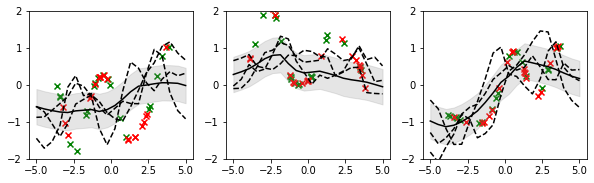

loss tf.Tensor(-0.65132403, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21874213, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001440.ckpt/assets


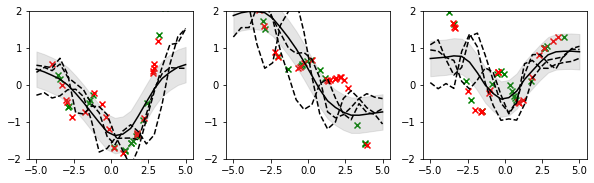

loss tf.Tensor(-0.65150714, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21922803, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001450.ckpt/assets


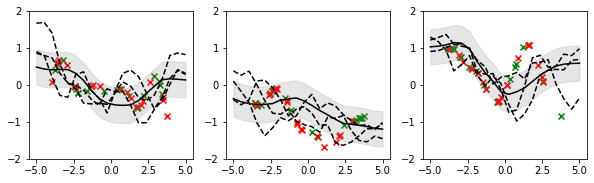

loss tf.Tensor(-0.6678908, shape=(), dtype=float32)
cov coeff tf.Tensor(0.21974006, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001460.ckpt/assets


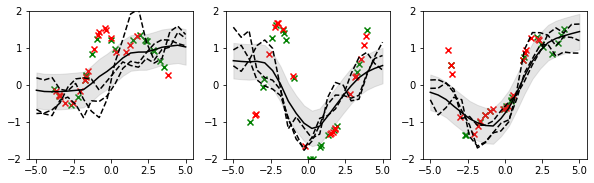

loss tf.Tensor(-0.67965335, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22024627, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001470.ckpt/assets


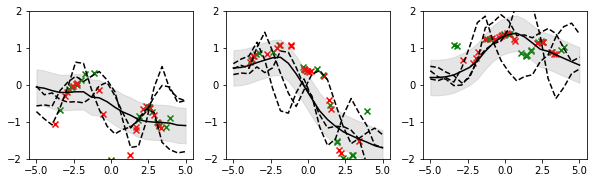

loss tf.Tensor(-0.6914017, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22069365, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001480.ckpt/assets


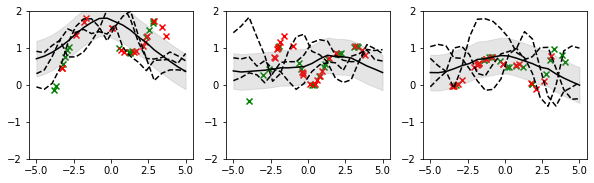

loss tf.Tensor(-0.6821016, shape=(), dtype=float32)
cov coeff tf.Tensor(0.221103, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001490.ckpt/assets


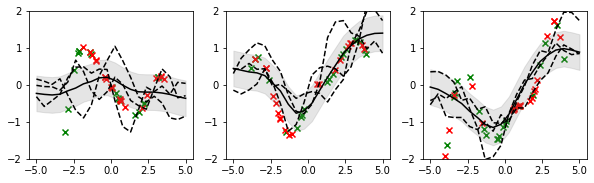

loss tf.Tensor(-0.6314828, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2215509, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001500.ckpt/assets


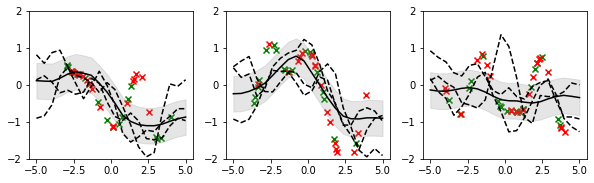

loss tf.Tensor(-0.6914174, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2220209, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001510.ckpt/assets


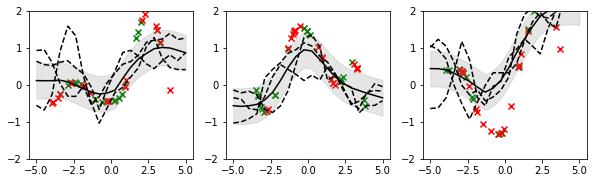

loss tf.Tensor(-0.66594756, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22248556, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001520.ckpt/assets


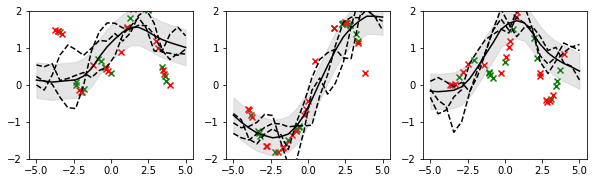

loss tf.Tensor(-0.71149886, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22294141, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001530.ckpt/assets


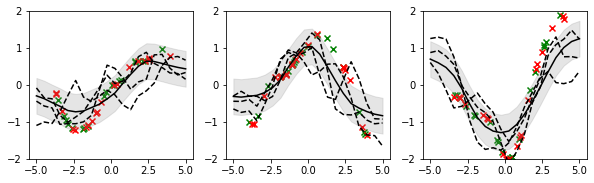

loss tf.Tensor(-0.6511782, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22340539, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001540.ckpt/assets


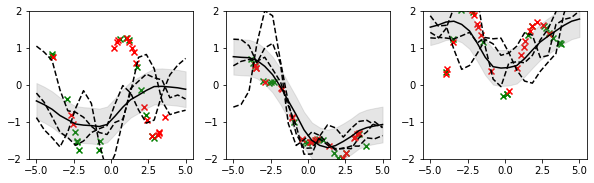

loss tf.Tensor(-0.663304, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2238787, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001550.ckpt/assets


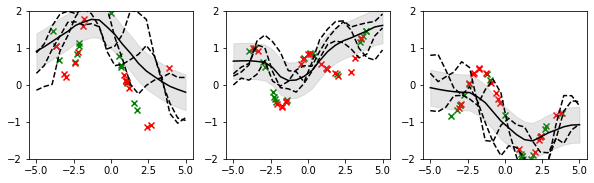

loss tf.Tensor(-0.625425, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22439434, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001560.ckpt/assets


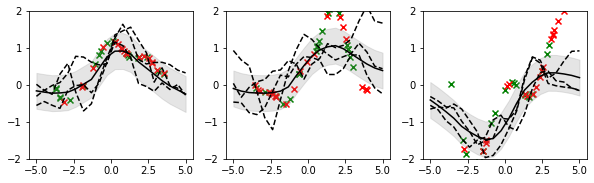

loss tf.Tensor(-0.6284995, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22489274, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001570.ckpt/assets


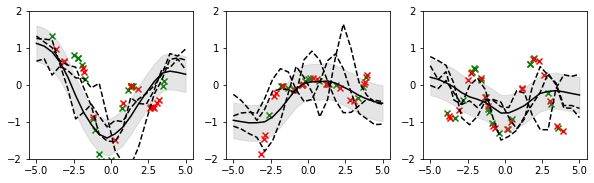

loss tf.Tensor(-0.63811255, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22537036, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001580.ckpt/assets


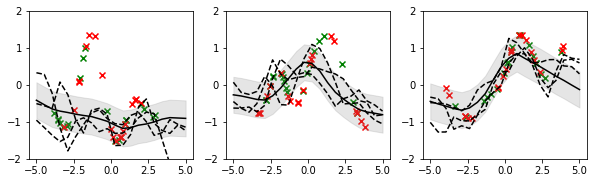

loss tf.Tensor(-0.7023765, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22585769, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001590.ckpt/assets


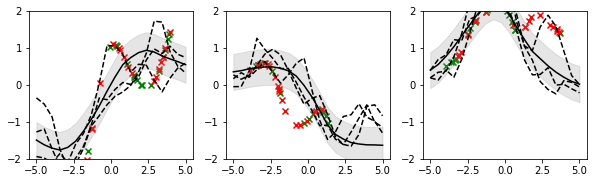

loss tf.Tensor(-0.6470755, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22633, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001600.ckpt/assets


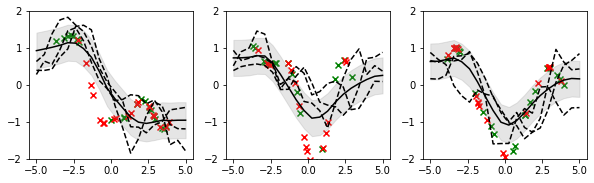

loss tf.Tensor(-0.667379, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22680706, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001610.ckpt/assets


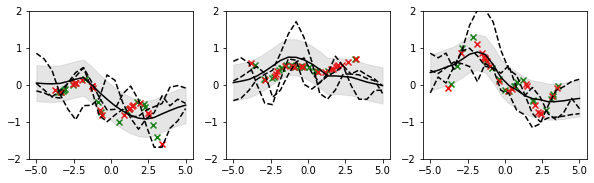

loss tf.Tensor(-0.6399202, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22733532, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001620.ckpt/assets


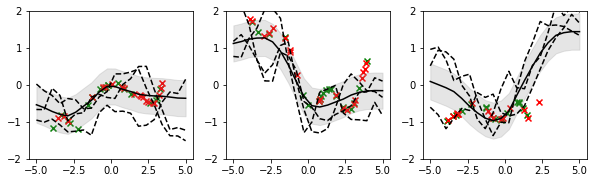

loss tf.Tensor(-0.66658354, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2278957, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001630.ckpt/assets


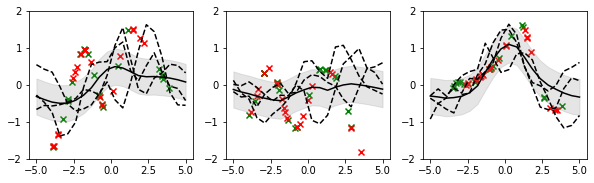

loss tf.Tensor(-0.67860466, shape=(), dtype=float32)
cov coeff tf.Tensor(0.228385, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001640.ckpt/assets


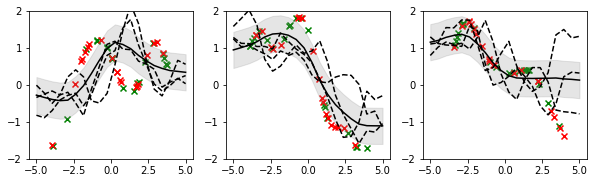

loss tf.Tensor(-0.69460243, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22881484, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001650.ckpt/assets


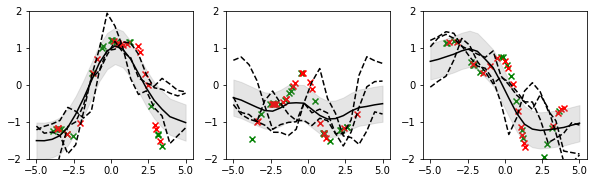

loss tf.Tensor(-0.6662862, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2292832, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001660.ckpt/assets


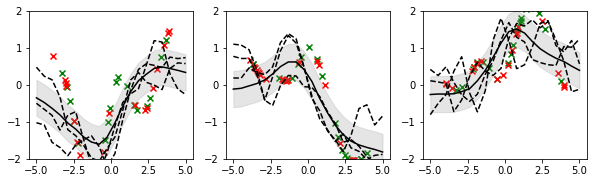

loss tf.Tensor(-0.6735502, shape=(), dtype=float32)
cov coeff tf.Tensor(0.22974594, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001670.ckpt/assets


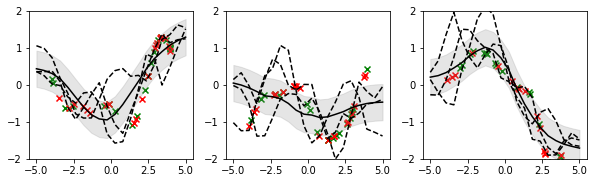

loss tf.Tensor(-0.658251, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23022681, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001680.ckpt/assets


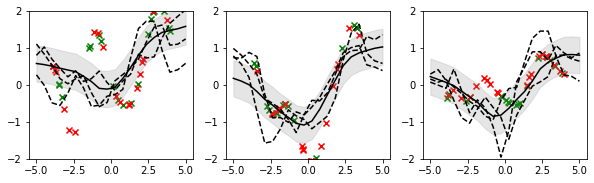

loss tf.Tensor(-0.64517736, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2307066, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001690.ckpt/assets


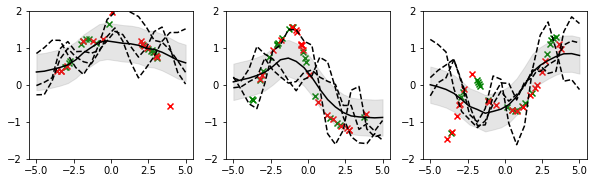

loss tf.Tensor(-0.66545033, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23113248, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001700.ckpt/assets


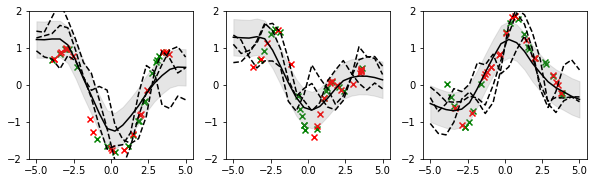

loss tf.Tensor(-0.65496606, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23160961, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001710.ckpt/assets


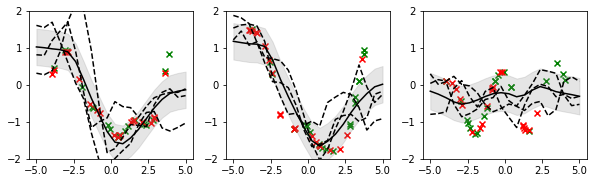

loss tf.Tensor(-0.63853, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2320918, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001720.ckpt/assets


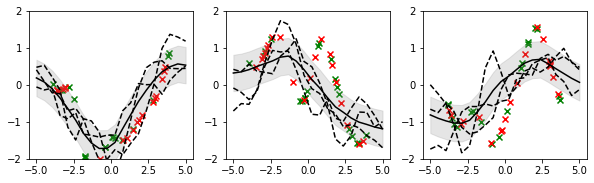

loss tf.Tensor(-0.69261545, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23258108, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001730.ckpt/assets


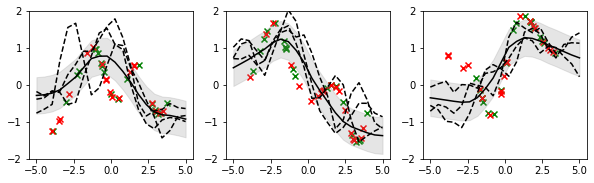

loss tf.Tensor(-0.63820595, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2330034, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001740.ckpt/assets


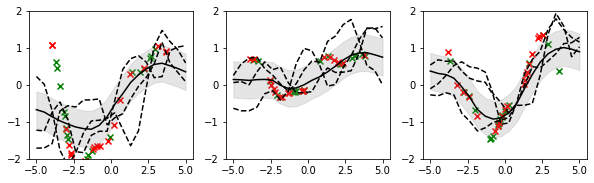

loss tf.Tensor(-0.7298868, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23344702, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001750.ckpt/assets


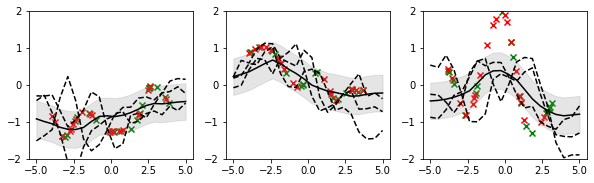

loss tf.Tensor(-0.62939095, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23387052, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001760.ckpt/assets


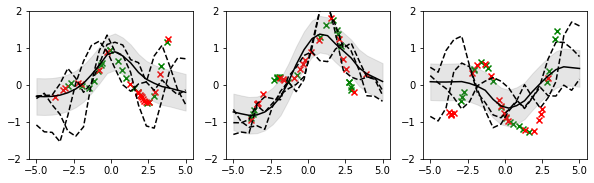

loss tf.Tensor(-0.68577033, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23429646, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001770.ckpt/assets


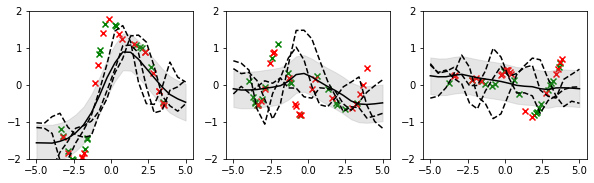

loss tf.Tensor(-0.6627459, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23473705, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001780.ckpt/assets


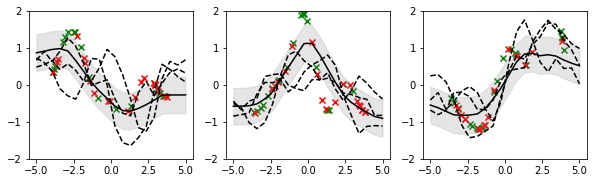

loss tf.Tensor(-0.69762224, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2352118, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001790.ckpt/assets


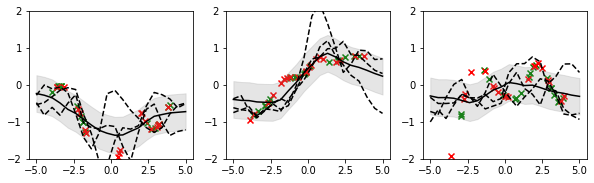

loss tf.Tensor(-0.67563224, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23567578, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001800.ckpt/assets


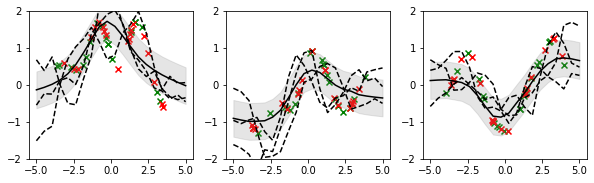

loss tf.Tensor(-0.69174093, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23614293, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001810.ckpt/assets


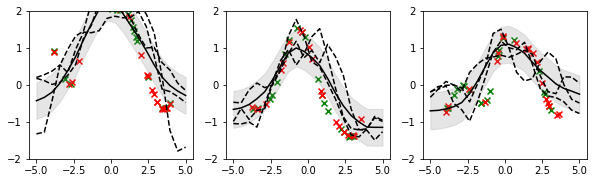

loss tf.Tensor(-0.64962226, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23660524, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001820.ckpt/assets


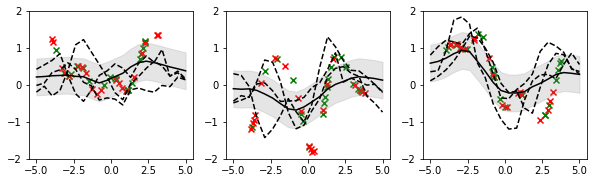

loss tf.Tensor(-0.62876517, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23712051, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001830.ckpt/assets


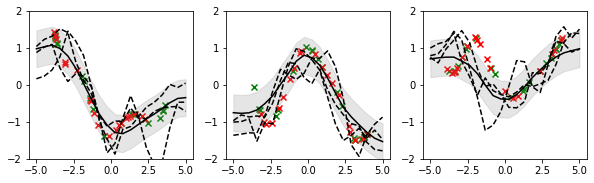

loss tf.Tensor(-0.682161, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2376162, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001840.ckpt/assets


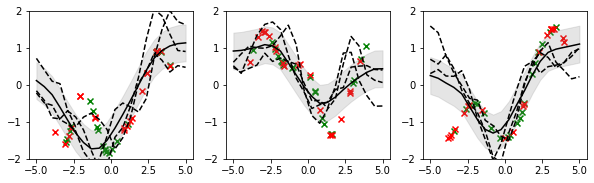

loss tf.Tensor(-0.7008986, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23809335, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001850.ckpt/assets


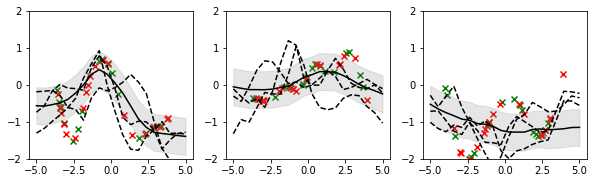

loss tf.Tensor(-0.6114101, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23855007, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001860.ckpt/assets


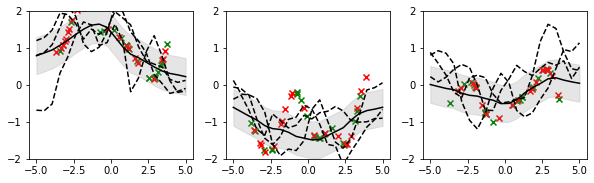

loss tf.Tensor(-0.6713446, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2390593, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001870.ckpt/assets


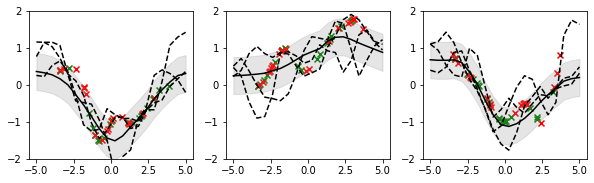

loss tf.Tensor(-0.64630693, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23955017, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001880.ckpt/assets


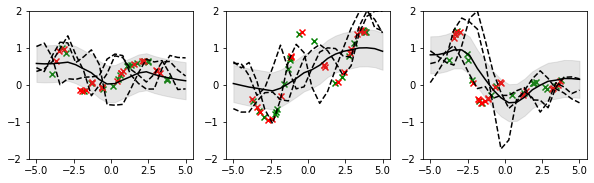

loss tf.Tensor(-0.69050646, shape=(), dtype=float32)
cov coeff tf.Tensor(0.23999704, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001890.ckpt/assets


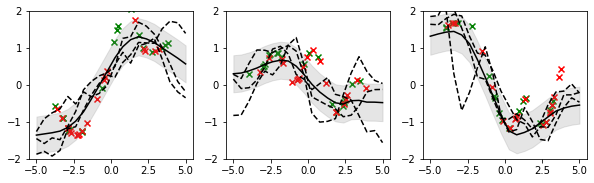

loss tf.Tensor(-0.704259, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24044853, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001900.ckpt/assets


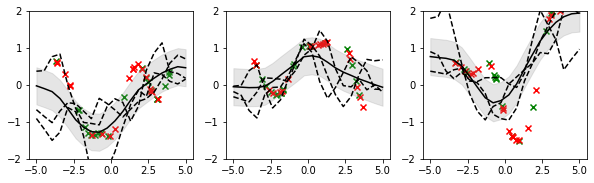

loss tf.Tensor(-0.66855246, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24085777, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001910.ckpt/assets


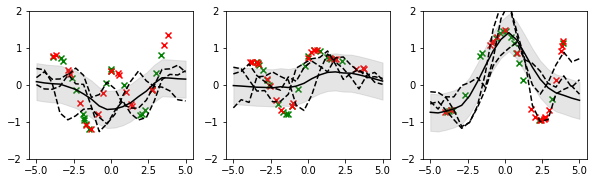

loss tf.Tensor(-0.67357445, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24136062, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001920.ckpt/assets


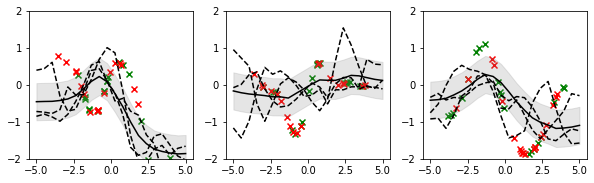

loss tf.Tensor(-0.6606667, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24190448, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001930.ckpt/assets


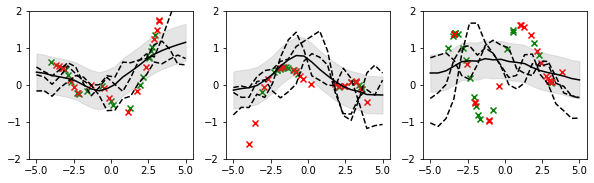

loss tf.Tensor(-0.627031, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24248974, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001940.ckpt/assets


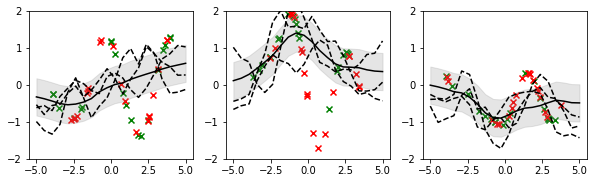

loss tf.Tensor(-0.69893724, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24302964, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001950.ckpt/assets


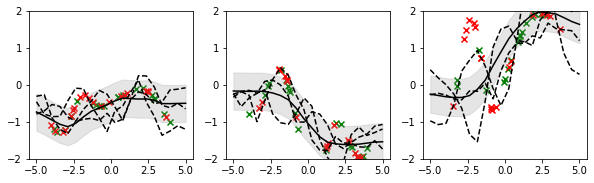

loss tf.Tensor(-0.65160525, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24353103, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001960.ckpt/assets


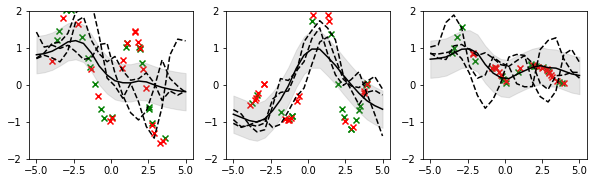

loss tf.Tensor(-0.6707367, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24405375, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001970.ckpt/assets


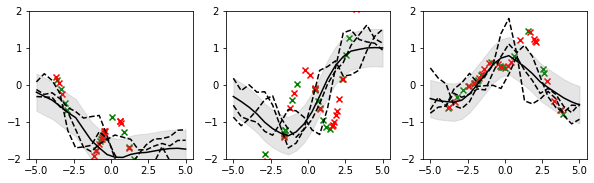

loss tf.Tensor(-0.674309, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24464588, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001980.ckpt/assets


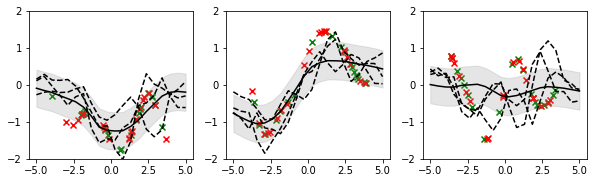

loss tf.Tensor(-0.64751977, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24518189, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/001990.ckpt/assets


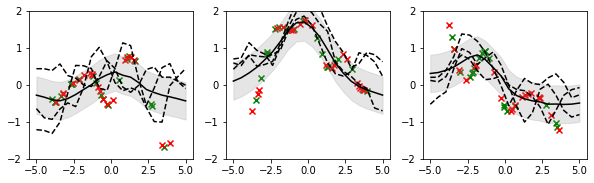

loss tf.Tensor(-0.66157997, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24565364, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002000.ckpt/assets


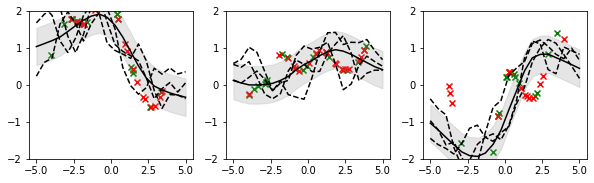

loss tf.Tensor(-0.6586459, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24614972, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002010.ckpt/assets


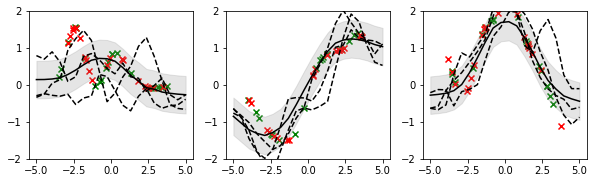

loss tf.Tensor(-0.69312835, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24669614, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002020.ckpt/assets


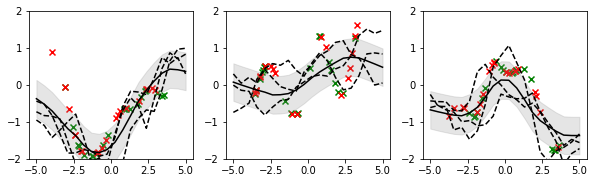

loss tf.Tensor(-0.687314, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24714035, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002030.ckpt/assets


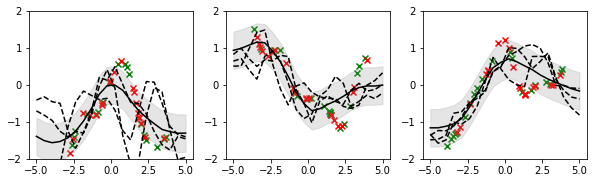

loss tf.Tensor(-0.6893663, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24745405, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002040.ckpt/assets


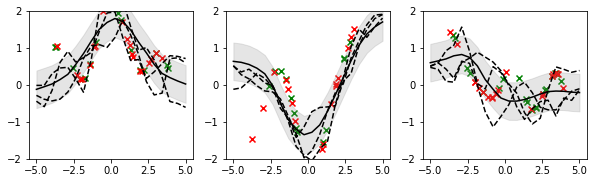

loss tf.Tensor(-0.6804445, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24779287, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002050.ckpt/assets


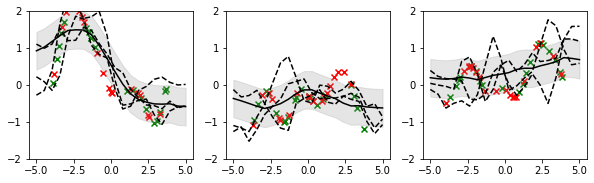

loss tf.Tensor(-0.676582, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24819285, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002060.ckpt/assets


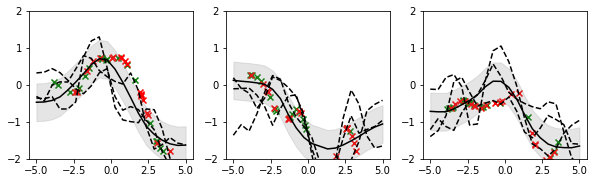

loss tf.Tensor(-0.7028192, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24865514, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002070.ckpt/assets


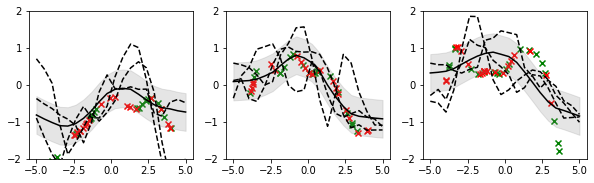

loss tf.Tensor(-0.65664554, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24908087, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002080.ckpt/assets


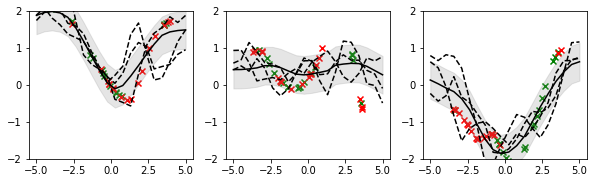

loss tf.Tensor(-0.6316735, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2494933, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002090.ckpt/assets


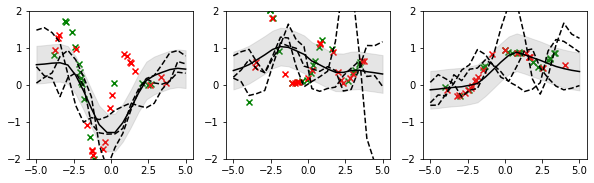

loss tf.Tensor(-0.7143078, shape=(), dtype=float32)
cov coeff tf.Tensor(0.24988309, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002100.ckpt/assets


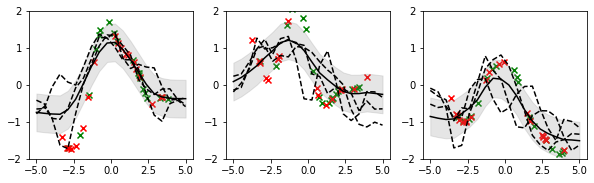

loss tf.Tensor(-0.65812075, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25028566, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002110.ckpt/assets


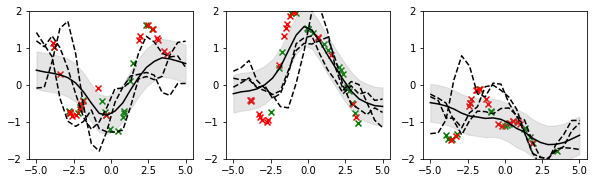

loss tf.Tensor(-0.71208435, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25073045, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002120.ckpt/assets


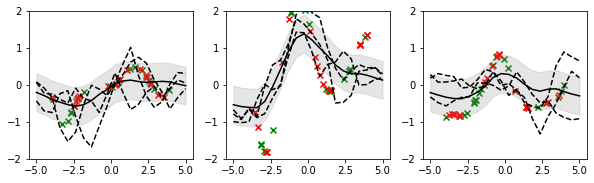

loss tf.Tensor(-0.66309494, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25116512, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002130.ckpt/assets


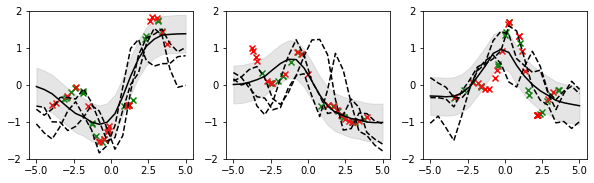

loss tf.Tensor(-0.6876997, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2515888, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002140.ckpt/assets


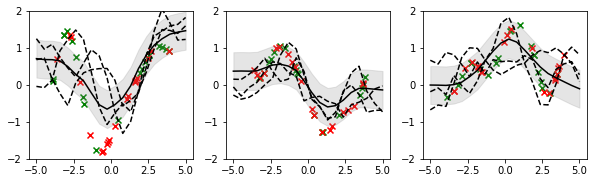

loss tf.Tensor(-0.7218593, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2519771, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002150.ckpt/assets


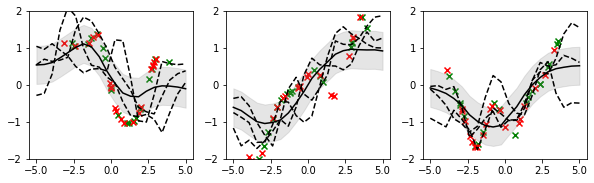

loss tf.Tensor(-0.685731, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25229397, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002160.ckpt/assets


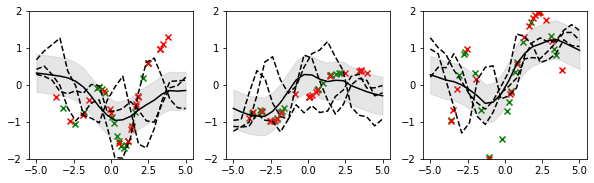

loss tf.Tensor(-0.6629212, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25273803, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002170.ckpt/assets


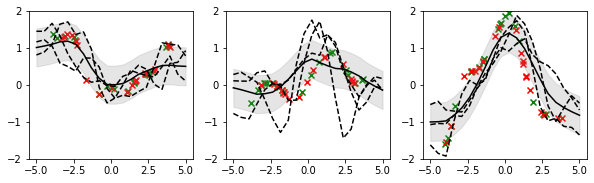

loss tf.Tensor(-0.7334323, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2531974, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002180.ckpt/assets


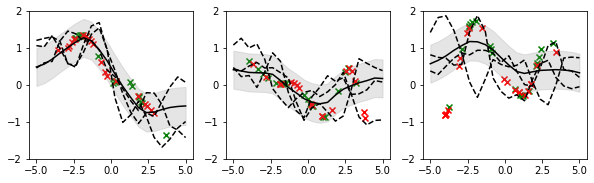

loss tf.Tensor(-0.69988817, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2535799, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002190.ckpt/assets


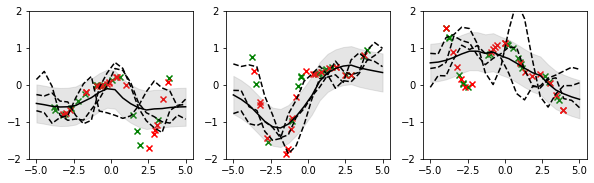

loss tf.Tensor(-0.675612, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2540181, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002200.ckpt/assets


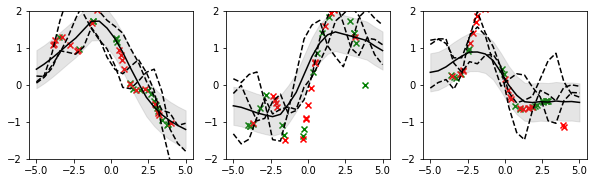

loss tf.Tensor(-0.6883709, shape=(), dtype=float32)
cov coeff tf.Tensor(0.254457, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002210.ckpt/assets


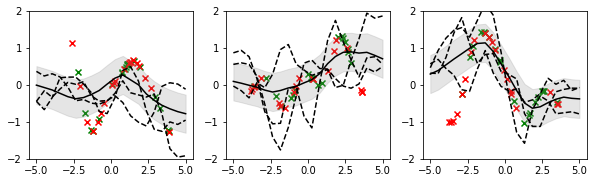

loss tf.Tensor(-0.7158236, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25482342, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002220.ckpt/assets


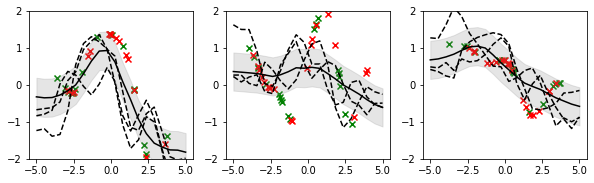

loss tf.Tensor(-0.67328036, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25515702, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002230.ckpt/assets


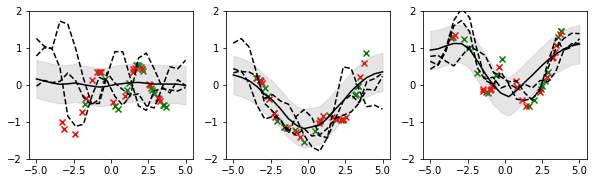

loss tf.Tensor(-0.6883013, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25557375, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002240.ckpt/assets


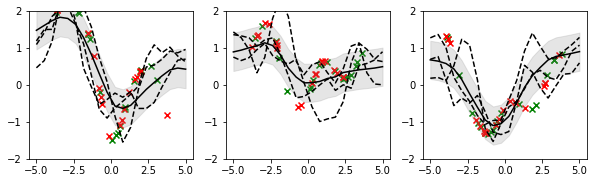

loss tf.Tensor(-0.70091474, shape=(), dtype=float32)
cov coeff tf.Tensor(0.256052, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002250.ckpt/assets


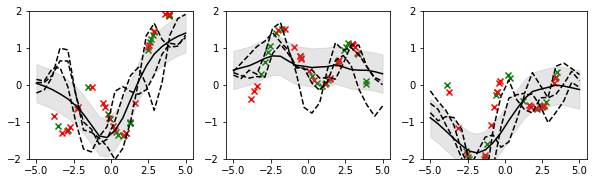

loss tf.Tensor(-0.6776491, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25649974, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002260.ckpt/assets


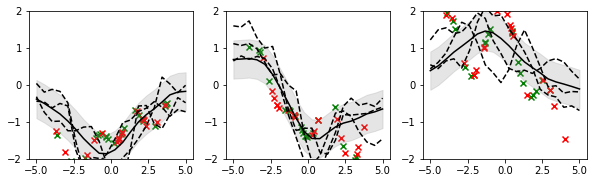

loss tf.Tensor(-0.720927, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25688276, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002270.ckpt/assets


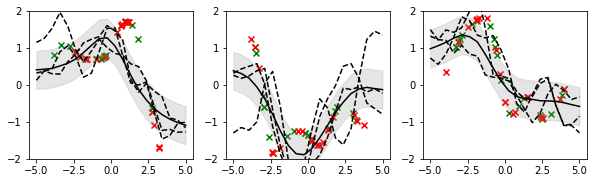

loss tf.Tensor(-0.7081631, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25721607, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002280.ckpt/assets


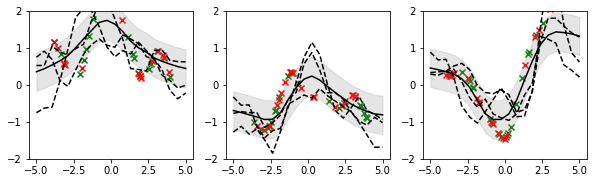

loss tf.Tensor(-0.707818, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25747165, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002290.ckpt/assets


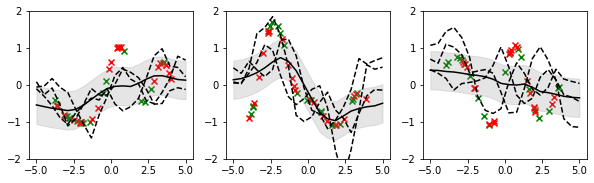

loss tf.Tensor(-0.68234384, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2576919, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002300.ckpt/assets


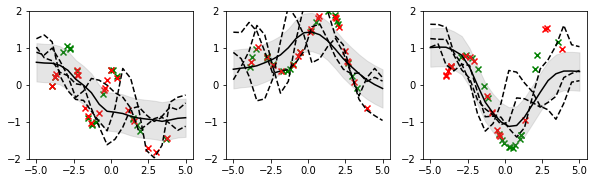

loss tf.Tensor(-0.69245225, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25804377, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002310.ckpt/assets


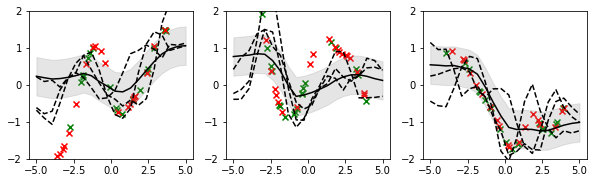

loss tf.Tensor(-0.68790895, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2583759, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002320.ckpt/assets


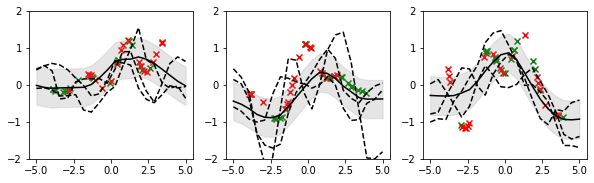

loss tf.Tensor(-0.6898635, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25878894, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002330.ckpt/assets


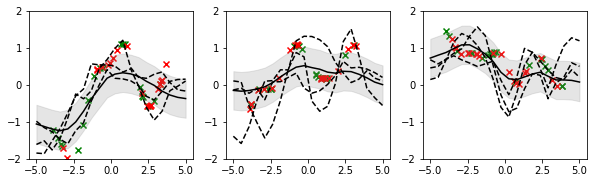

loss tf.Tensor(-0.6717665, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25919697, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002340.ckpt/assets


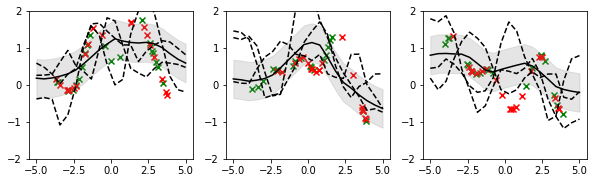

loss tf.Tensor(-0.66468215, shape=(), dtype=float32)
cov coeff tf.Tensor(0.25960127, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002350.ckpt/assets


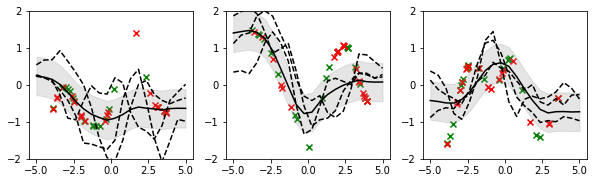

loss tf.Tensor(-0.65766877, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26005298, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002360.ckpt/assets


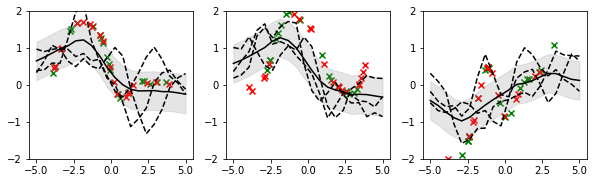

loss tf.Tensor(-0.6823551, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26044244, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002370.ckpt/assets


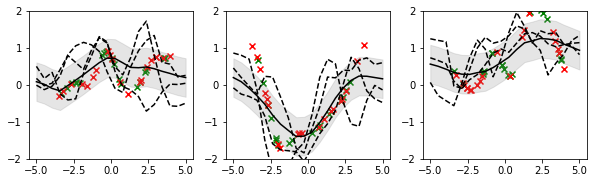

loss tf.Tensor(-0.6685489, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26079547, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002380.ckpt/assets


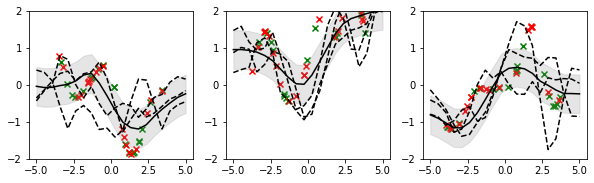

loss tf.Tensor(-0.681739, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26108995, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002390.ckpt/assets


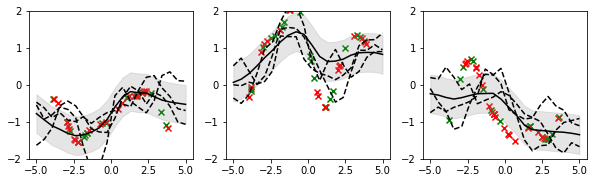

loss tf.Tensor(-0.74417084, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26132277, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002400.ckpt/assets


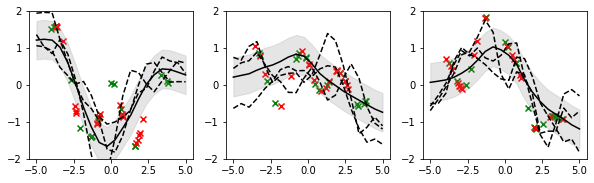

loss tf.Tensor(-0.7138651, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26151553, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002410.ckpt/assets


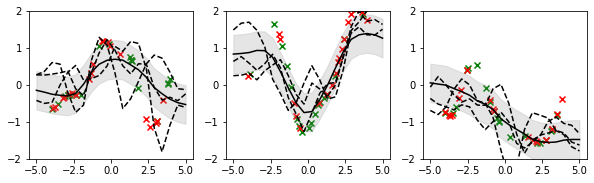

loss tf.Tensor(-0.68871725, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26178858, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002420.ckpt/assets


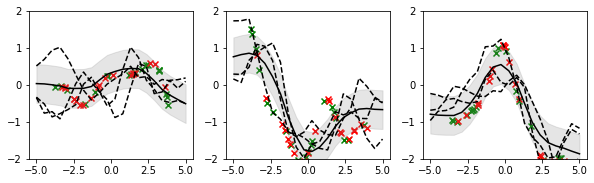

loss tf.Tensor(-0.70288116, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26208776, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002430.ckpt/assets


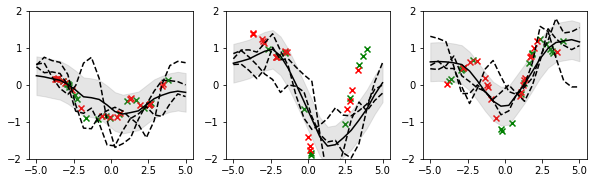

loss tf.Tensor(-0.68660265, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26232114, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002440.ckpt/assets


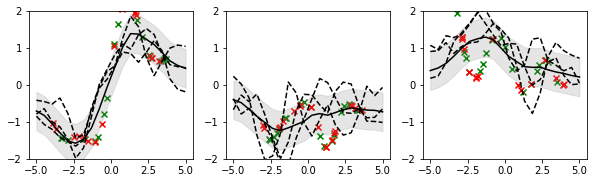

loss tf.Tensor(-0.70368004, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26257113, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002450.ckpt/assets


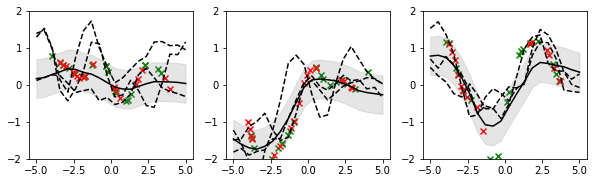

loss tf.Tensor(-0.6582699, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26279256, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002460.ckpt/assets


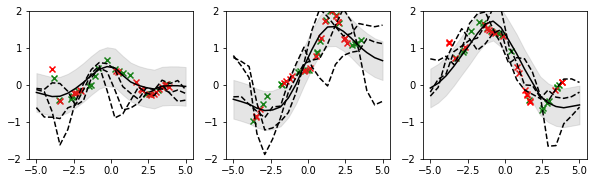

loss tf.Tensor(-0.68215317, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26312968, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002470.ckpt/assets


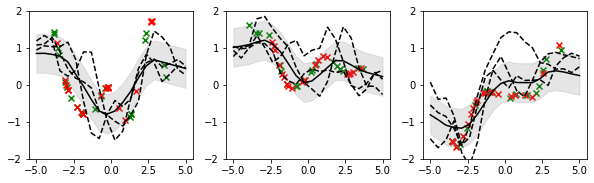

loss tf.Tensor(-0.6734936, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26344156, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002480.ckpt/assets


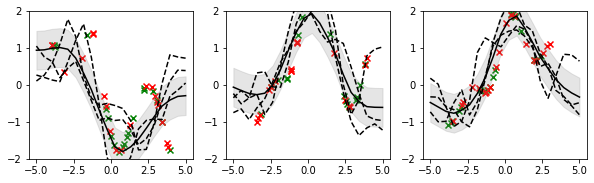

loss tf.Tensor(-0.6571985, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2637913, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002490.ckpt/assets


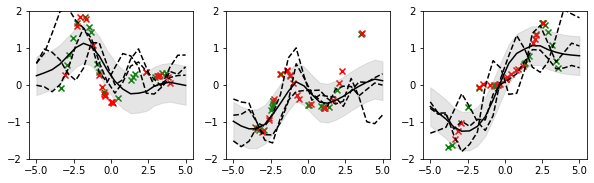

loss tf.Tensor(-0.70038813, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26416087, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002500.ckpt/assets


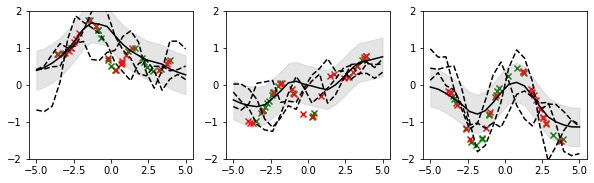

loss tf.Tensor(-0.685801, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2645929, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002510.ckpt/assets


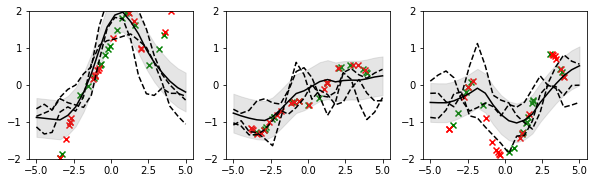

loss tf.Tensor(-0.6592603, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2650721, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002520.ckpt/assets


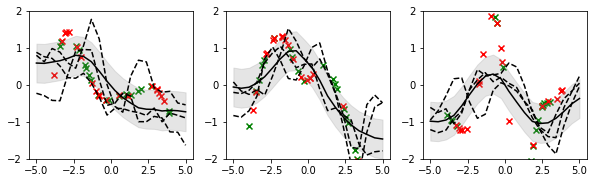

loss tf.Tensor(-0.7002951, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26558822, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002530.ckpt/assets


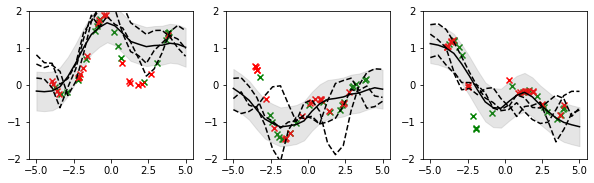

loss tf.Tensor(-0.73917955, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26593003, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002540.ckpt/assets


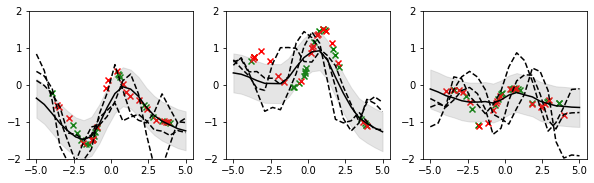

loss tf.Tensor(-0.65241784, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2661702, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002550.ckpt/assets


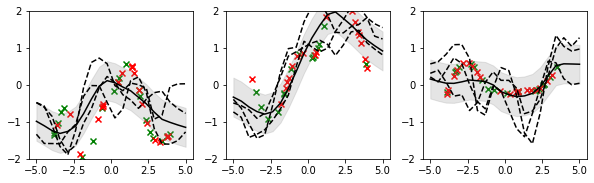

loss tf.Tensor(-0.6812461, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26646218, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002560.ckpt/assets


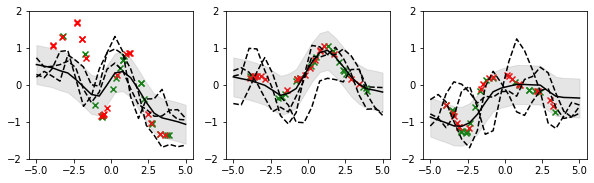

loss tf.Tensor(-0.6946817, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26679185, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002570.ckpt/assets


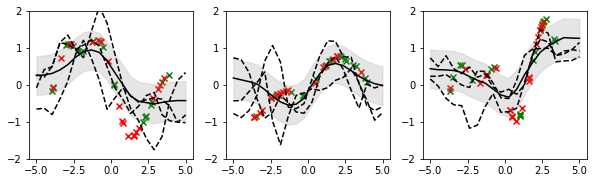

loss tf.Tensor(-0.69706476, shape=(), dtype=float32)
cov coeff tf.Tensor(0.2670588, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002580.ckpt/assets


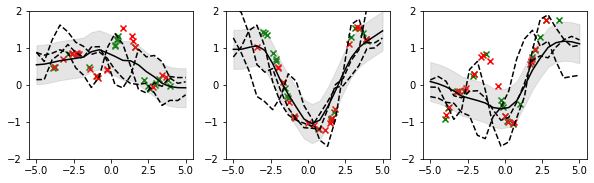

loss tf.Tensor(-0.6747943, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26736206, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002590.ckpt/assets


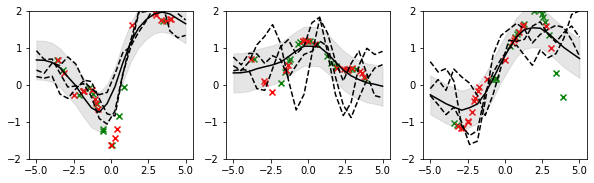

loss tf.Tensor(-0.7270361, shape=(), dtype=float32)
cov coeff tf.Tensor(0.26757213, shape=(), dtype=float32)
INFO:tensorflow:Assets written to: model-checkpoints/cnp/2021-01-22--14-42-46/002600.ckpt/assets


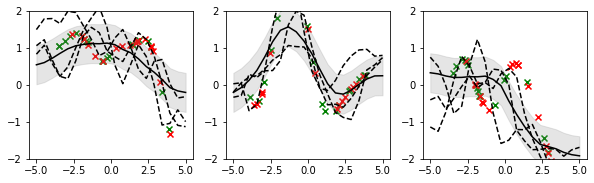

In [ ]:
input_dim = 1
output_dim = 1
cov_dim = 64
rep_dim = 128
enc_hidden_dims = [128, 128]
dec_hidden_dims = [128, 128, 128, 128]
nonlinearity = 'relu'

encoder_ffn = FeedforwardNetwork(input_dim=(input_dim + output_dim),
                                 output_dim=rep_dim,
                                 hidden_dims=enc_hidden_dims,
                                 nonlinearity=nonlinearity)

decoder_mean_ffn = FeedforwardNetwork(input_dim=(input_dim + rep_dim),
                                      output_dim=output_dim,
                                      hidden_dims=dec_hidden_dims,
                                      nonlinearity=nonlinearity)

decoder_cov_ffn = FeedforwardNetwork(input_dim=(input_dim + rep_dim),
                                     output_dim=cov_dim,
                                     hidden_dims=dec_hidden_dims,
                                     nonlinearity=nonlinearity)

decoder_likelihood = FullCovGaussianLikelihood()

encoder = NeuralNetworkEncoder(feedforward_network=encoder_ffn)

decoder = NeuralNetworkDecoder(mean_network=decoder_mean_ffn,
                               cov_network=decoder_cov_ffn,
                               likelihood=decoder_likelihood)

cnp = CNP(encoder=encoder, decoder=decoder)

learning_rate = 1e-3
num_steps = int(1e5)
num_samples = 1

optimiser = tf.keras.optimizers.Adam(learning_rate=learning_rate)    

x_min = -4.
x_max = 4.
num_datasets = 20
num_datapoints = 40
scale = 1e0
cov_coeff = 1e0
noise_coeff = 1e-4

current_time = datetime.datetime.now().strftime("%Y-%m-%d--%H-%M-%S")
train_log_dir = f'logs/cnp/{current_time}/train'
print(train_log_dir)
train_writer = tf.summary.create_file_writer(train_log_dir)

for i in range(num_steps):

    x, y = sample_1d_datasets_from_gp(x_min=x_min,
                                      x_max=x_max,
                                      num_datasets=num_datasets,
                                      num_datapoints=num_datapoints,
                                      scale=scale,
                                      cov_coeff=cov_coeff,
                                      noise_coeff=noise_coeff)

    x, y = tf.cast(x[..., None], dtype=tf.float32), tf.cast(y[..., None], dtype=tf.float32)
    
    with tf.GradientTape() as tape:
        
        loss = cnp.loss(x=x, y=y, num_samples=num_samples)
    
    gradients = tape.gradient(loss, cnp.trainable_variables)
    optimiser.apply_gradients(zip(gradients, cnp.trainable_variables))
    
    with train_writer.as_default():
        tf.summary.scalar('Log Likelihood', - loss, step=i)
        
    if i % 10 == 0:
            
        print('loss', loss)
        print('cov coeff', tf.exp(cnp.decoder.log_cov_coeff))
            
        tf.saved_model.save(cnp, f'model-checkpoints/cnp/{current_time}/{i:06d}.ckpt')

        plt.figure(figsize=(10, 6))

        for i in range(3):

            xlin = tf.linspace(-5., 5., 20)[None, :, None]
            n = num_datapoints // 2 # np.random.choice(np.arange(1, x.shape[1], 1))
            
            plt.subplot(2, 3, i+1)
            plt.scatter(x[i, :n, 0], y[i, :n, 0], marker='x', color='green')
            plt.scatter(x[i, n:, 0], y[i, n:, 0], marker='x', color='red')
            
            pred_dist, cov, cov_plus_noise = cnp(x[i:i+1, :n, :], y[i:i+1, :n, :], xlin)

            x_plot = np.array(xlin)[0, :, 0]
            mean = np.array(pred_dist.loc)[0, :]
            stdev = np.diag(np.array(cov_plus_noise)[0]) ** 0.5
            
            chol = np.linalg.cholesky(np.array(cov_plus_noise)[0])
            for j in range(3):
                sample = mean + chol @ np.random.normal(size=(x_plot.shape[0],))
                plt.plot(x_plot, sample, '--', color='k')

            plt.plot(x_plot, mean, color='black')
            plt.fill_between(x_plot, mean - stdev, mean + stdev, color='gray', alpha=0.2)
            
            plt.ylim([-2, 2])

        plt.show()

In [ ]:
task = 0
n = 1

tf.random.set_seed(1)

xlin = tf.linspace(-6., 6., 100)[None, :, None]

plt.figure(figsize=(5, 5))
plt.scatter(x[task, :n, 0], y[task, :n, 0], marker='o', color='black', s=30, zorder=3)

pred_dist = cnp(x[task:task+1, :n, :], y[task:task+1, :n, :], xlin)

mean = pred_dist.loc
stdev = pred_dist.scale

x_plot = np.array(xlin)[0, :, 0]
mean = np.array(mean)[0, :, 0]
stdev = np.array(stdev)[0, :, 0]

plt.plot(x_plot, mean, color='black')
plt.fill_between(x_plot, mean - stdev, mean +  stdev, color='gray', alpha=0.1)

plt.ylim([-4, 4])
plt.xlim([-5, 5])
plt.yticks([-4, -2, 0, 2, 4])
plt.axis('off')
plt.savefig('presentation/img/cnp-cartoon.pdf')
plt.show()

In [ ]:
B = 7
D = 3

mean = tf.ones(shape=(B, D))
cov = tf.concat([tf.eye(D)[None, :, :] for i in range(B)], axis=0)
rand = tf.random.uniform(shape=(B, D))

print(mean.shape, cov.shape, rand.shape)

dist = tfd.MultivariateNormalFullCovariance(mean, cov)
dist.log_prob(rand)